In [1]:
#install.packages(c("dplyr","TSstudio","forecast","tidyr"))

In [2]:
library(dplyr)
library(TSstudio)
library(forecast)
library(tidyr)
library(plotly)
library(ggplot2)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Registered S3 method overwritten by 'quantmod':
  method            from
  as.zoo.data.frame zoo 

Registered S3 methods overwritten by 'forecast':
  method             from    
  fitted.fracdiff    fracdiff
  residuals.fracdiff fracdiff

Loading required package: ggplot2


Attaching package: ‘plotly’


The following object is masked from ‘package:ggplot2’:

    last_plot


The following object is masked from ‘package:stats’:

    filter


The following object is masked from ‘package:graphics’:

    layout




In [3]:
data <- read.csv("sql_input.csv")
head(data)

X,Scenario,Product,Sub.Product,Date,Volumes
0,Field Ops - Mass Markets - Test 7/7/2021,SOUTHWEST,AZ,20201201,34786
1,Field Ops - Mass Markets - Test 7/7/2021,EAST,NORTHEAST,20190101,44454
2,Field Ops - Mass Markets - Test 7/7/2021,EAST,FL_TX,20191001,48903
3,Field Ops - Mass Markets - Test 7/7/2021,NORTHERN,HEARTLAND,20200801,39536
4,Field Ops - Mass Markets - Test 7/7/2021,NORTHERN,WA_MT,20210401,19653
5,Field Ops - Mass Markets - Test 7/7/2021,NORTHERN,HEARTLAND,20190801,44817


In [4]:
data[1] <- NULL
head(data)

Scenario,Product,Sub.Product,Date,Volumes
Field Ops - Mass Markets - Test 7/7/2021,SOUTHWEST,AZ,20201201,34786
Field Ops - Mass Markets - Test 7/7/2021,EAST,NORTHEAST,20190101,44454
Field Ops - Mass Markets - Test 7/7/2021,EAST,FL_TX,20191001,48903
Field Ops - Mass Markets - Test 7/7/2021,NORTHERN,HEARTLAND,20200801,39536
Field Ops - Mass Markets - Test 7/7/2021,NORTHERN,WA_MT,20210401,19653
Field Ops - Mass Markets - Test 7/7/2021,NORTHERN,HEARTLAND,20190801,44817


In [5]:
# Data Manipulation

# Remove the Unassigned Prod/Subproduct
data <-data[!grepl("UNASSIGNED", data$Sub.Product),]

# Change the date column into a ymd format
data$Date <- as.character(data$Date) %>%
  lubridate::ymd()

# Remove all dates from August 2021 and later (SHOULD BE CHANGED AS)
data <- data %>% filter(Date < "2021-08-01")

# Combine product and subproduct columns, because code is based off unique subproduct
data$product_subproduct <- paste(data$Product, data$Sub.Product,sep="_and_")

# Remove Product and subproduct column, since we already created a combined column
data <- data[ , -which(names(data) %in% c("Product","Sub.Product"))]
    
# Keep product_subproduct with 22 observations or more, can be changed
data<-data %>%
     group_by(product_subproduct) %>%
     filter(n() >= 22) %>%
     ungroup

# Find the max date for both scenarios, then take the minimum of the x amount of scenarios
data %>%
   group_by(Scenario) %>%
   slice_max(n = 1, order_by = Date) %>%
   ungroup %>%
   pull(Date) %>%
   min -> Min_date

# Fill with 0's from lowest date (Jan 2019 in this case) to our new max date (May 2021 for field ops)
data <-data %>%
  complete(Date = seq.Date(from = min(Date), to = as.Date(Min_date), by = 'month'), 
           nesting(Scenario,product_subproduct), fill = list(Volumes = 0))

# Impute the mean from Jan 2019 to Dec 2020 (Our training data, not sure why some data is missing in Jan 2019, Feb 2019)
data <- data %>%
     group_by(product_subproduct)  %>%
     mutate(Volumes = replace(Volumes, Volumes == 0, 
         mean(Volumes[Volumes != 0  & 
    between(Date, as.Date("2019-01-01"), as.Date("2020-12-01"))], 
         na.rm = TRUE))) 

# I have 0's for any months missing up to Dec 2022 (format to export later, and also we are forecasting until Dec 2022)
data <- dplyr::group_by(data,data$Scenario) %>%
  complete(Date = seq.Date(from = max(Date), to = as.Date('2022-12-01'), by = 'month'), 
           nesting(Scenario,product_subproduct), fill = list(Volumes = 0))

# Organize the data by date and product_subproduct
data <- dplyr::arrange(data,data$Date)
data <- dplyr::arrange(data,data$product_subproduct)
data <- dplyr::ungroup(data)
data <- data[ -c(1) ]

# Arrange scenario and automatically subset data by unique scenario
data <- dplyr::arrange(data,data$Scenario)
un1 <- unique(data$Scenario)
for(i in seq_along(un1)) 
     assign(paste0('scenario', i), subset(data, Scenario == un1[i]))

In [6]:
# For the 2nd or 3rd ... scenario I exported this as a csv, go to Forecast_Scenario2 and run code there
write.csv(scenario2,"scenario2_input.csv", row.names = FALSE)
write.csv(scenario3,"scenario2_input.csv", row.names = FALSE)

ERROR: Error in is.data.frame(x): object 'scenario3' not found


In [7]:
# Data should be Date/Scenario/Product_Subproduct/Volumes (4 columns at this point)
# List of dataframes by subproduct+product for output
# EAST_AND_FL_TX is one element of the list and the content is a dataframe with date/scenario/product+subproduct/volumes
# Split by Product+Subproduct
export_df_s1 <- split(scenario1[1:4], scenario1[3])

# Same as export_df_s1, but with only volumes in the dataframes
dummy_list_s1 <- split(scenario1[1:4], scenario1[3]) %>% lapply( function(x) x[(names(x) %in% c("Date", "Volumes"))])
dummy_list_s1 <-  lapply(dummy_list_s1, function(x) { x["Date"] <- NULL; x })

# list of volumes for each prod/subproduct
# Each element of the list is containing volumes for the entire subproduct as a double
# Need this for creation of time series                                                                                                                                
list_dfs_s1 <- list()
for (i in 1:length(unique(scenario1$product_subproduct))) {
  list_dfs_s1 <-append(list_dfs_s1,dummy_list_s1[[i]])
}

#combined_dfs_s1 <- Reduce(function(x, y) merge(x, y, all = TRUE,  by='Date'), list(list_dfs_s1))

# List of time series for scenario1, with train and test split
# You will need to change the end date for each different scenario if the end date is different
# Jan 2019 should be imputed if missing so the start should be static, assuming we use 2019 data
# Frequency is 12 bc monthly data
list_ts_s1 <- lapply(list_dfs_s1, function(t) ts(t,start=c(2019,1),end=c(2021,7), frequency = 12)) %>%
                  lapply( function(t) ts_split(t,sample.out=(5)))    # creates my train test split
list_ts_s1 <- do.call("rbind", list_ts_s1)  #Creates a list of time series                         

HTML widgets cannot be represented in plain text (need html)

HTML widgets cannot be represented in plain text (need html)

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”


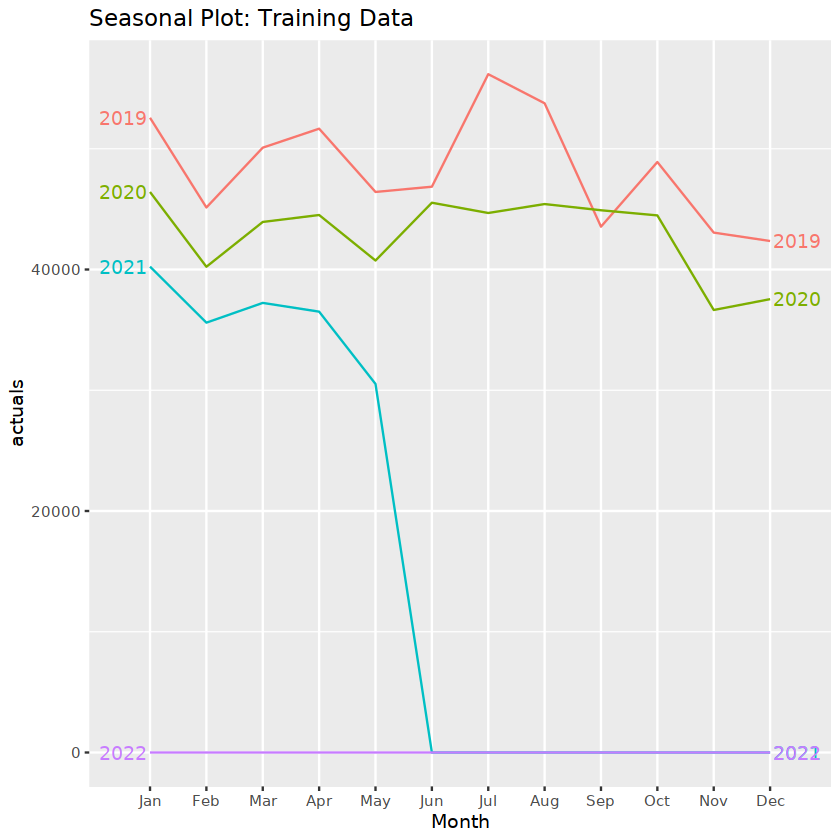

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”


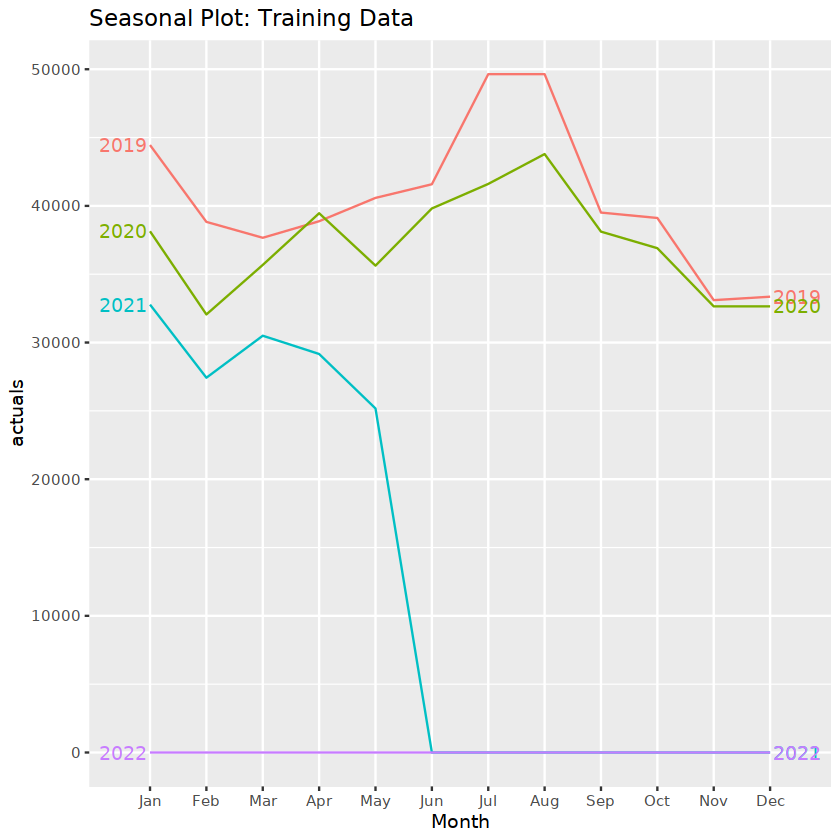

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”


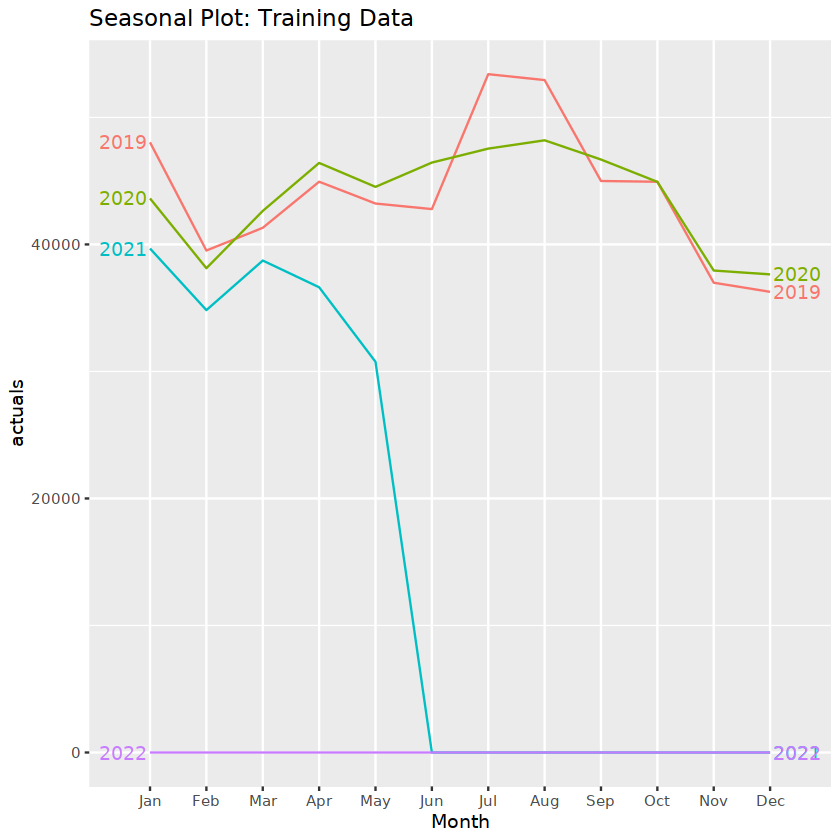

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”


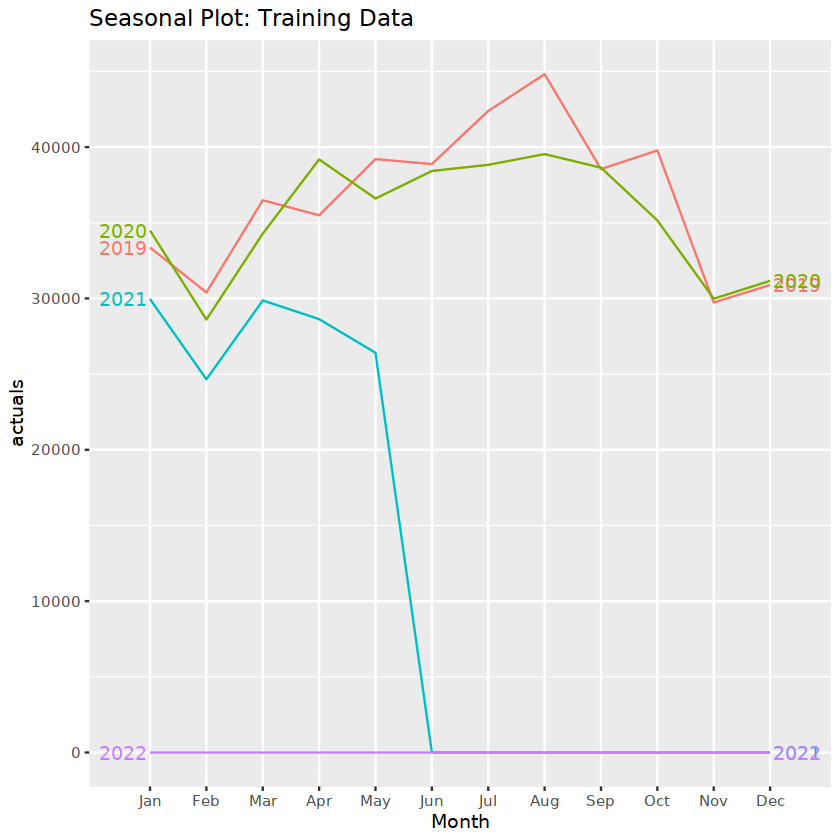

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”


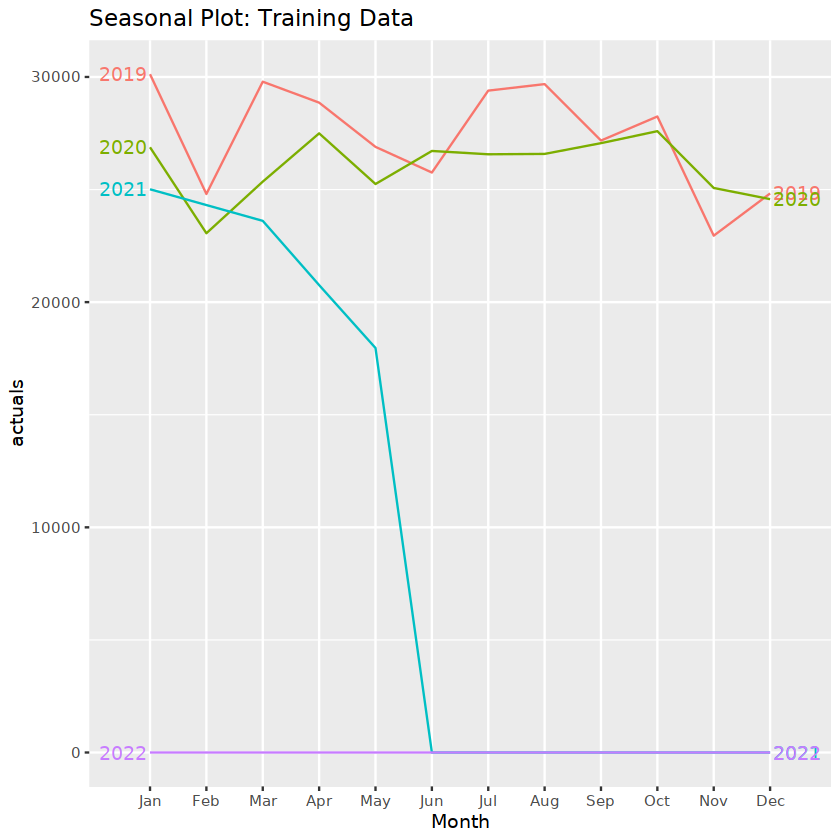

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”


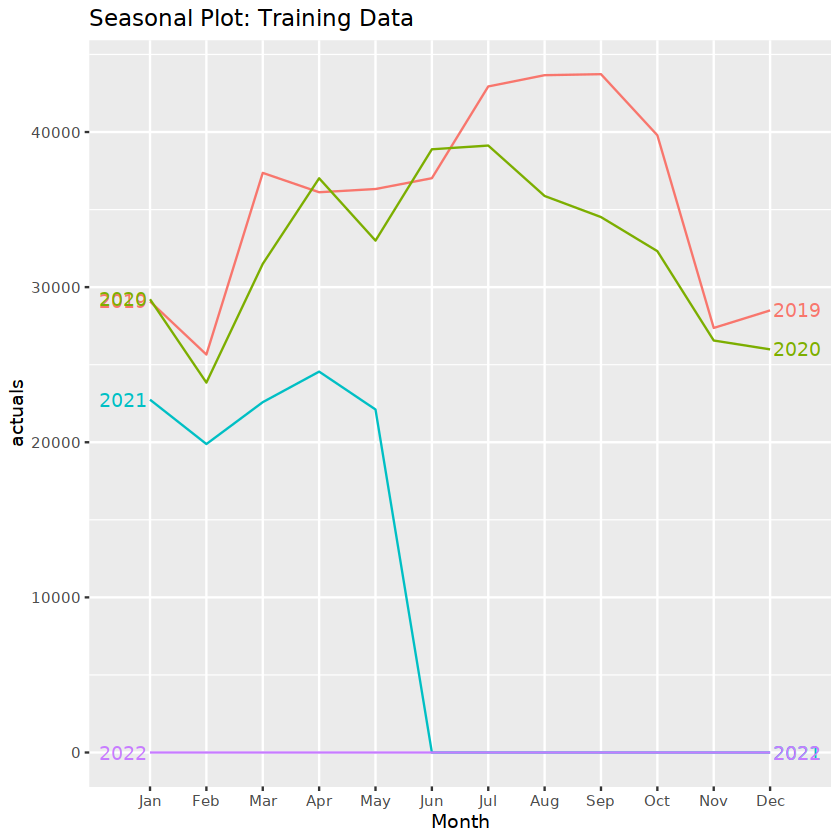

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”


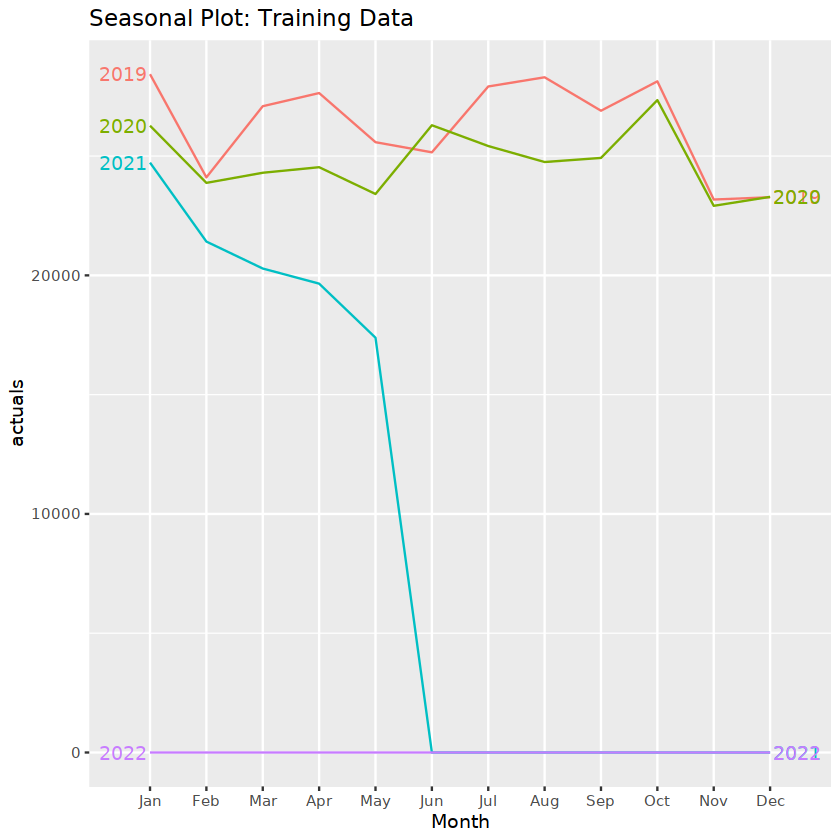

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”


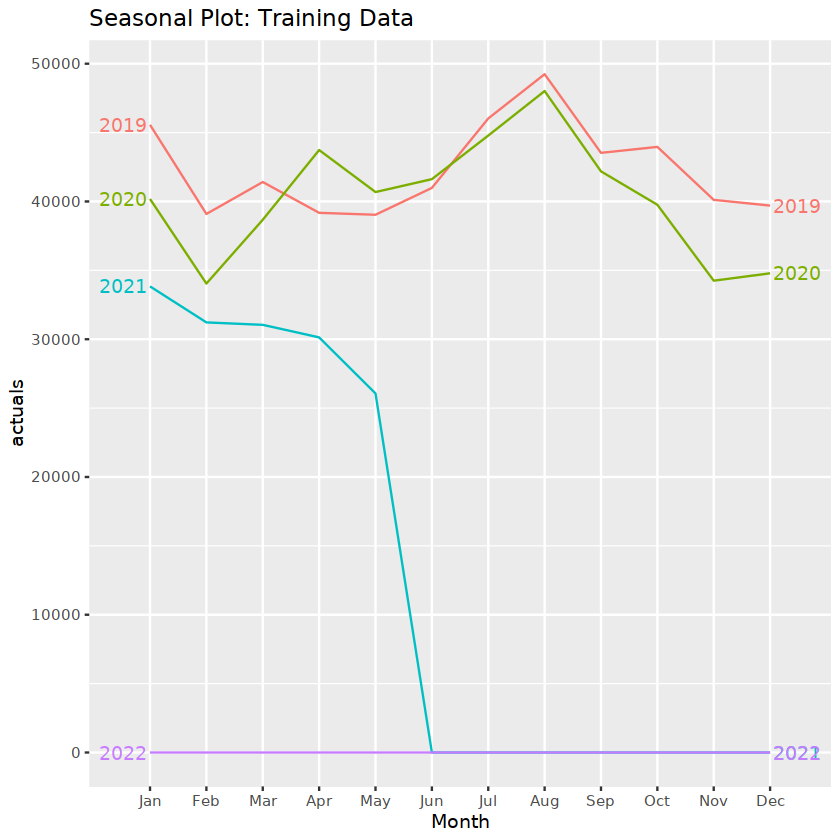

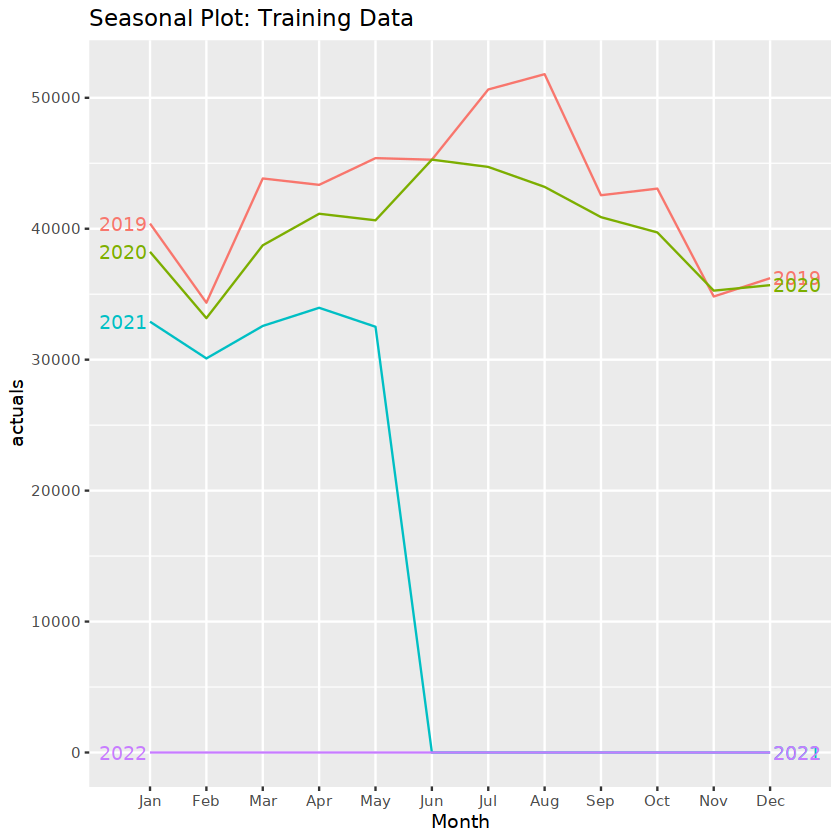

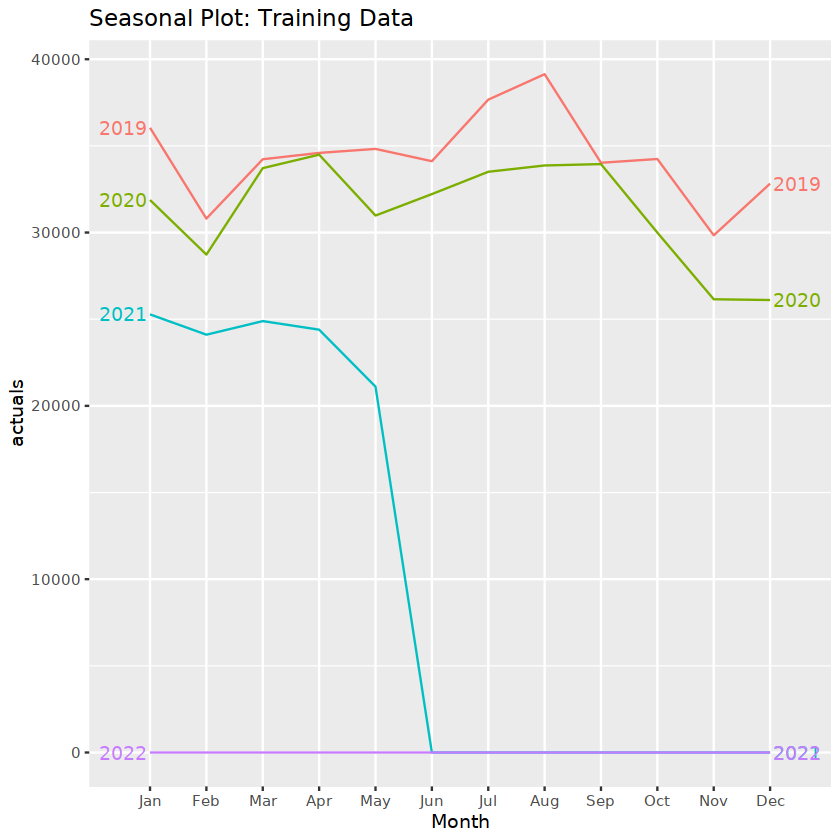

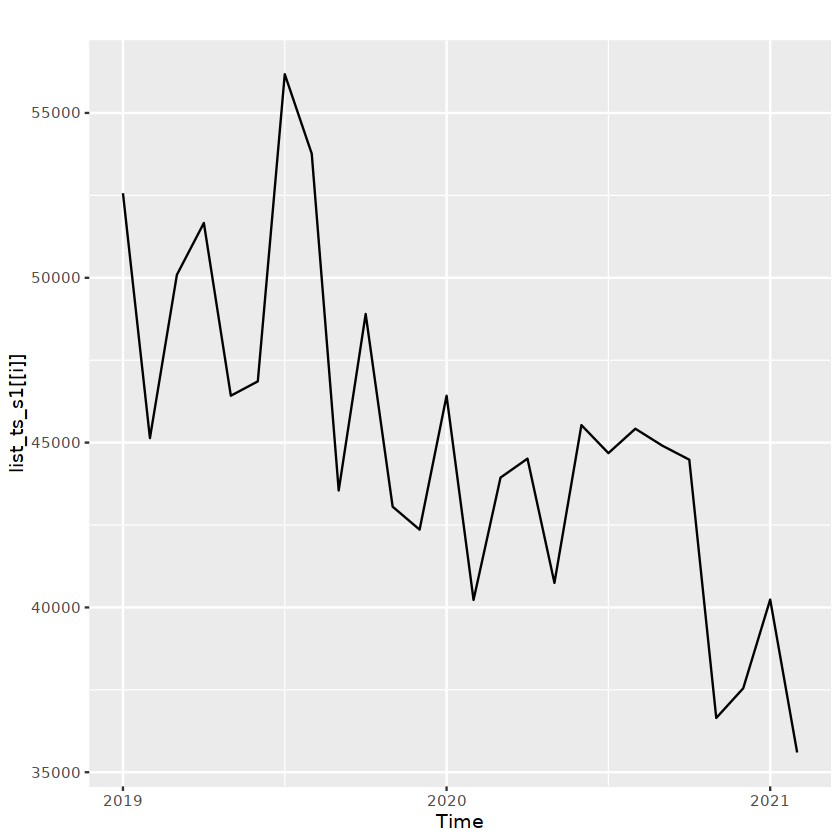

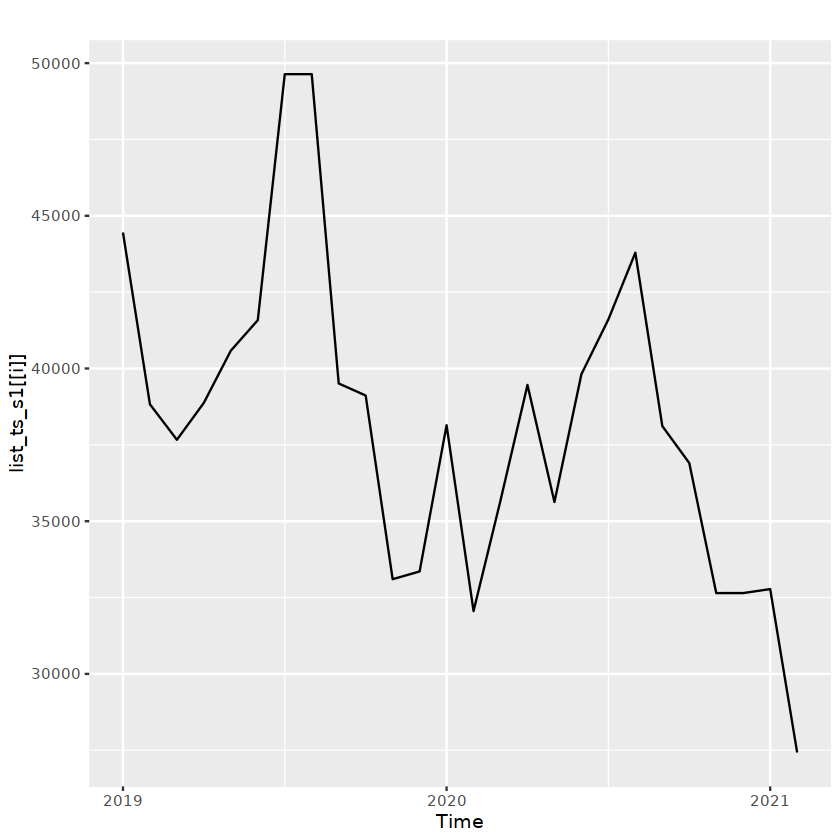

...

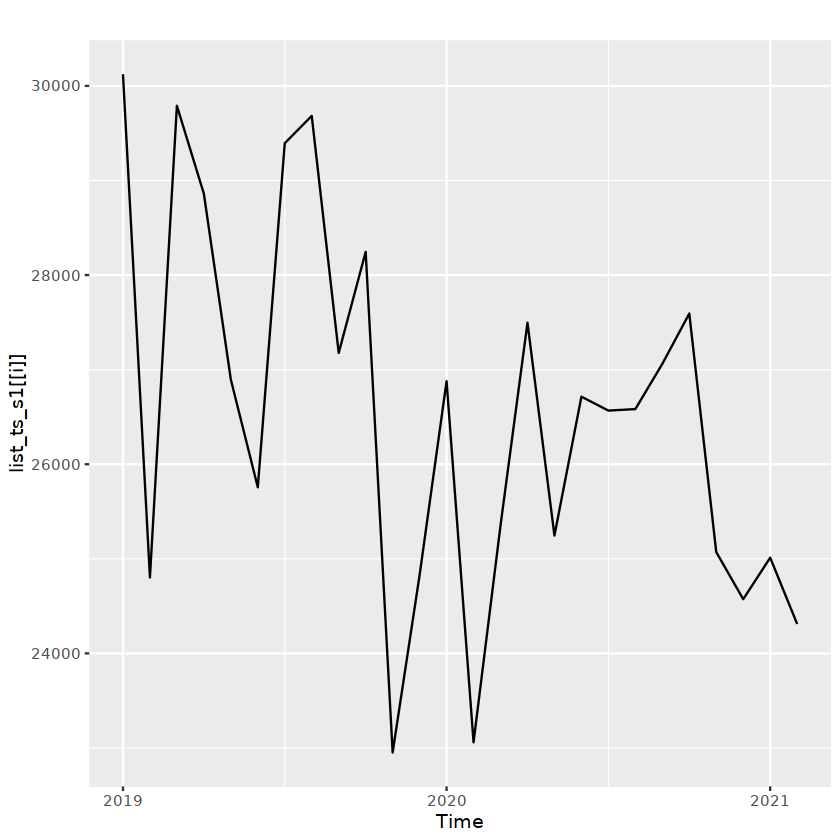

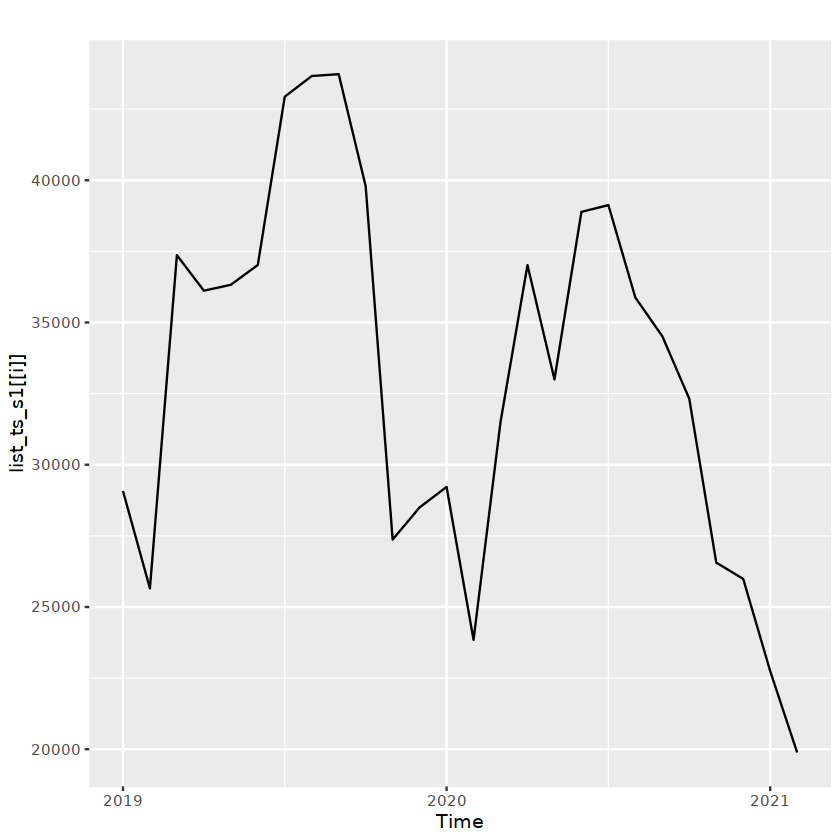

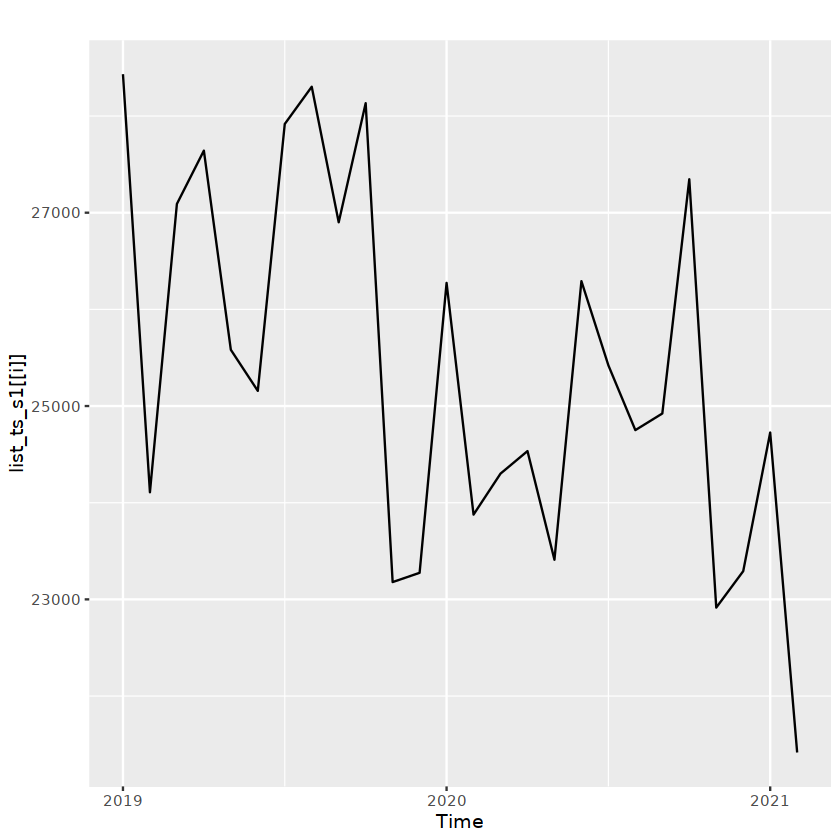

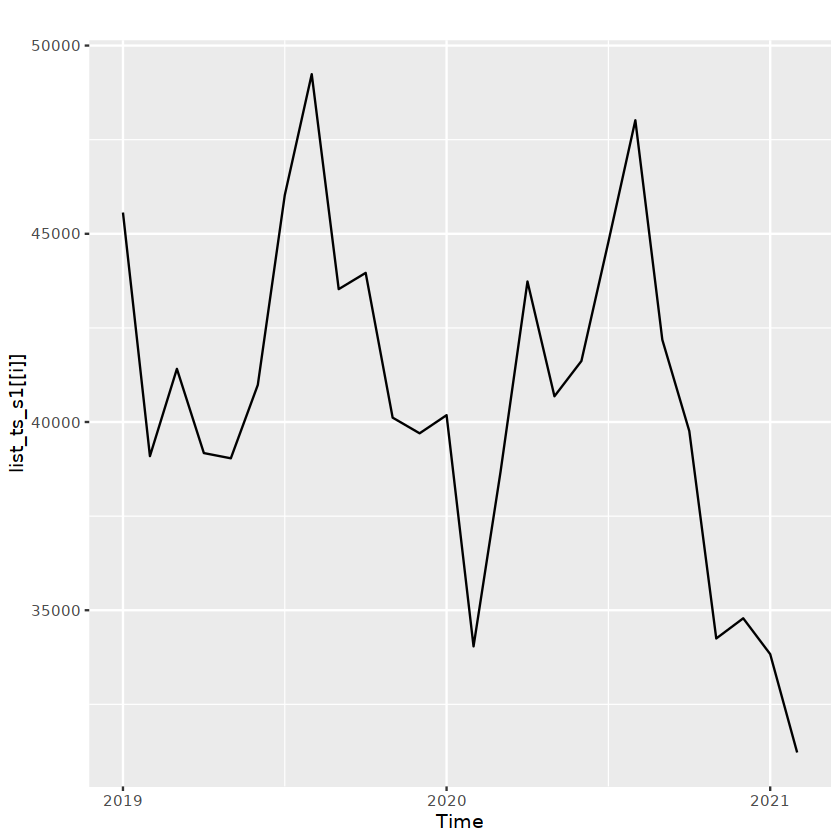

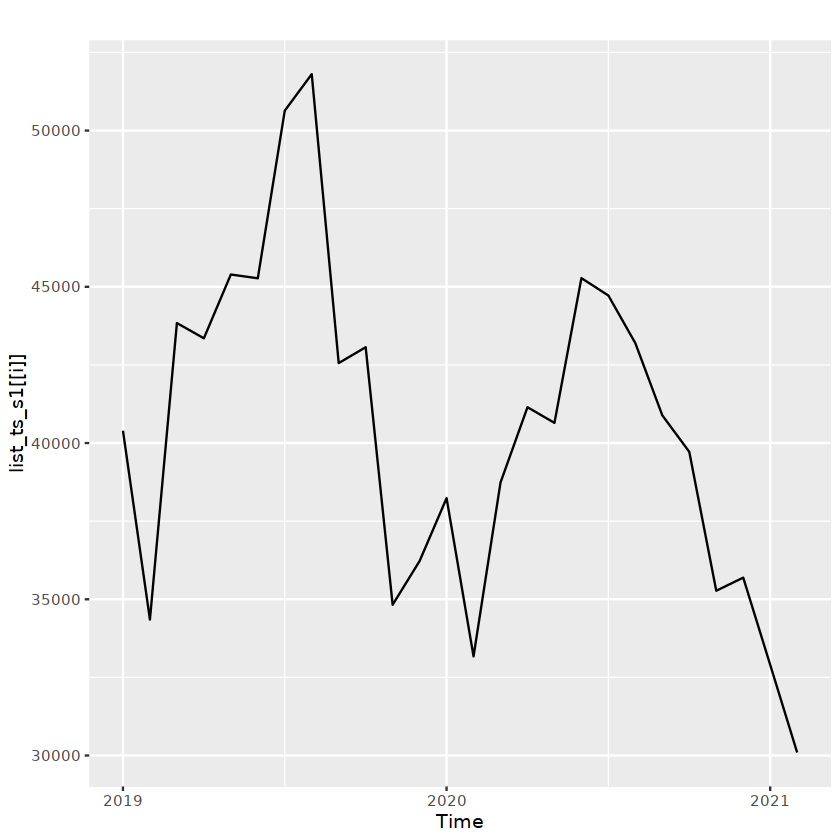

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”


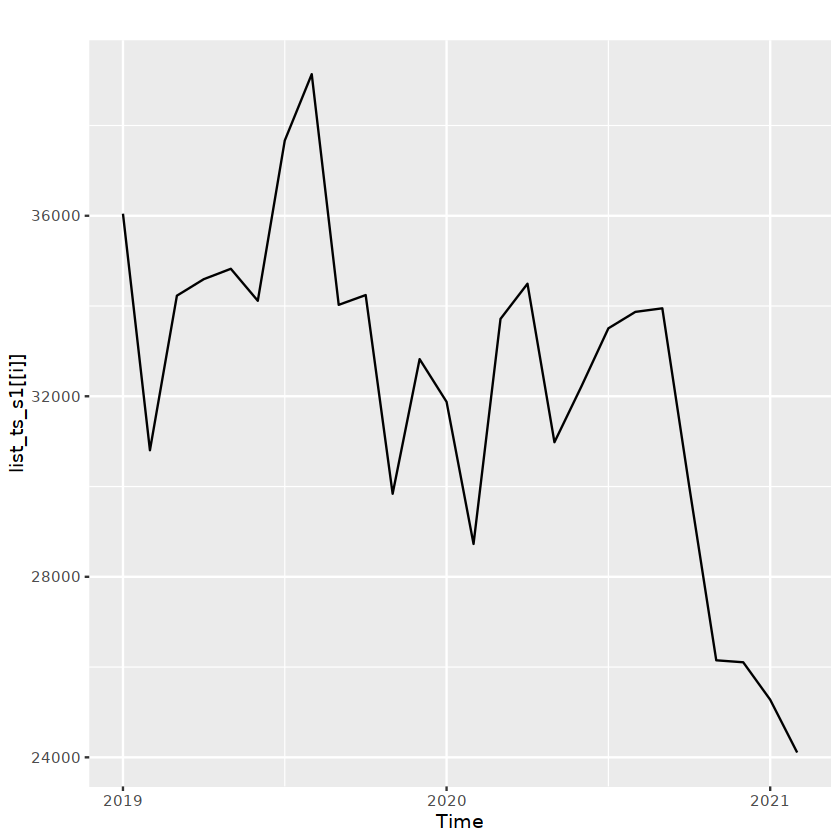

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”


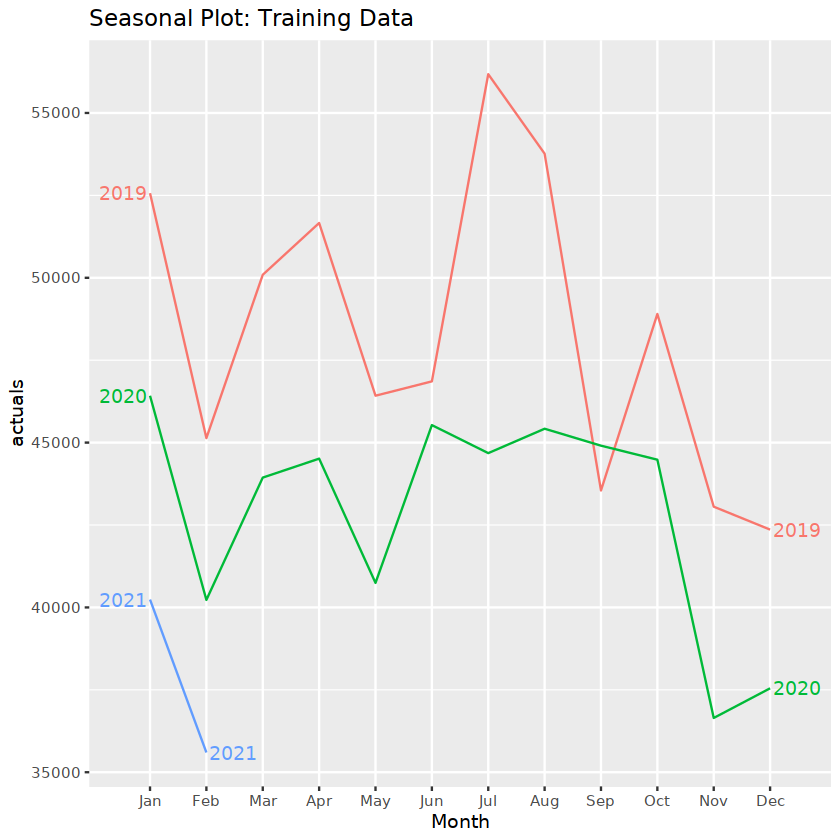

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”


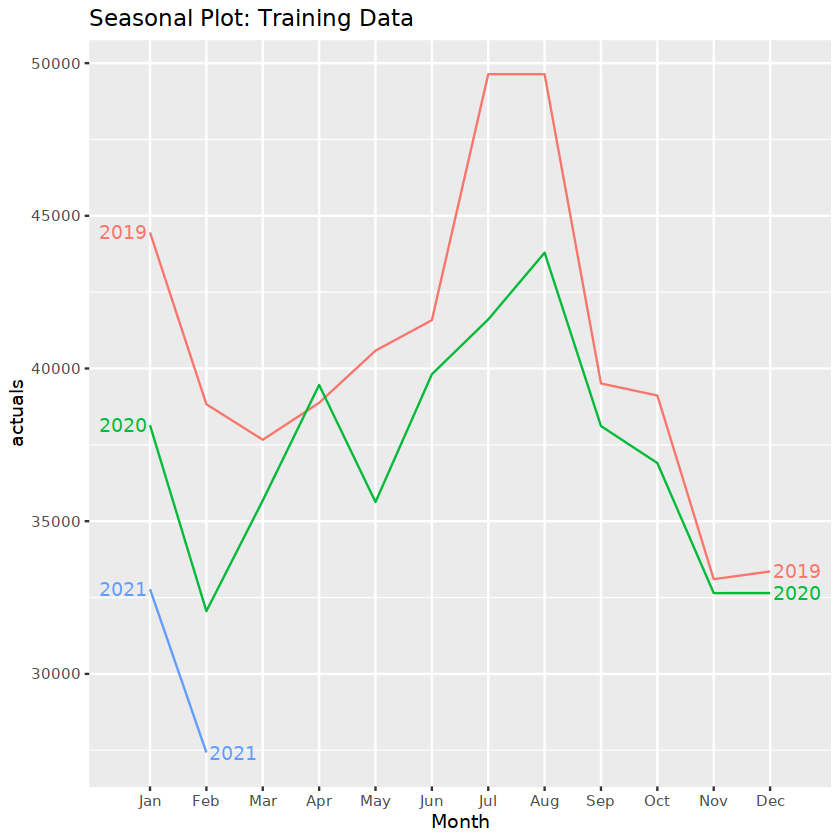

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”


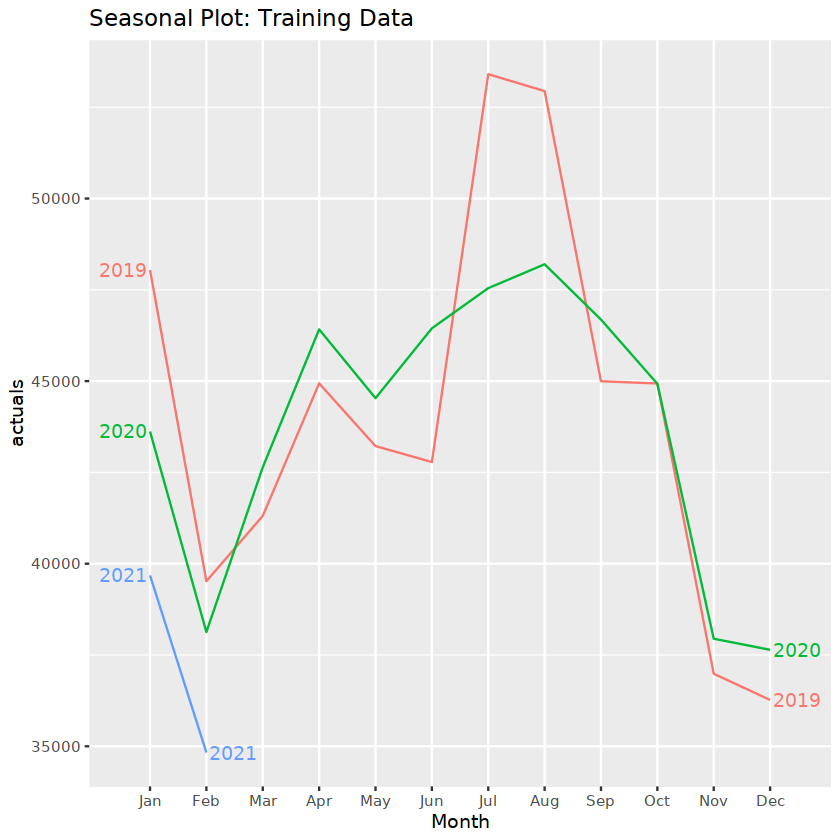

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”


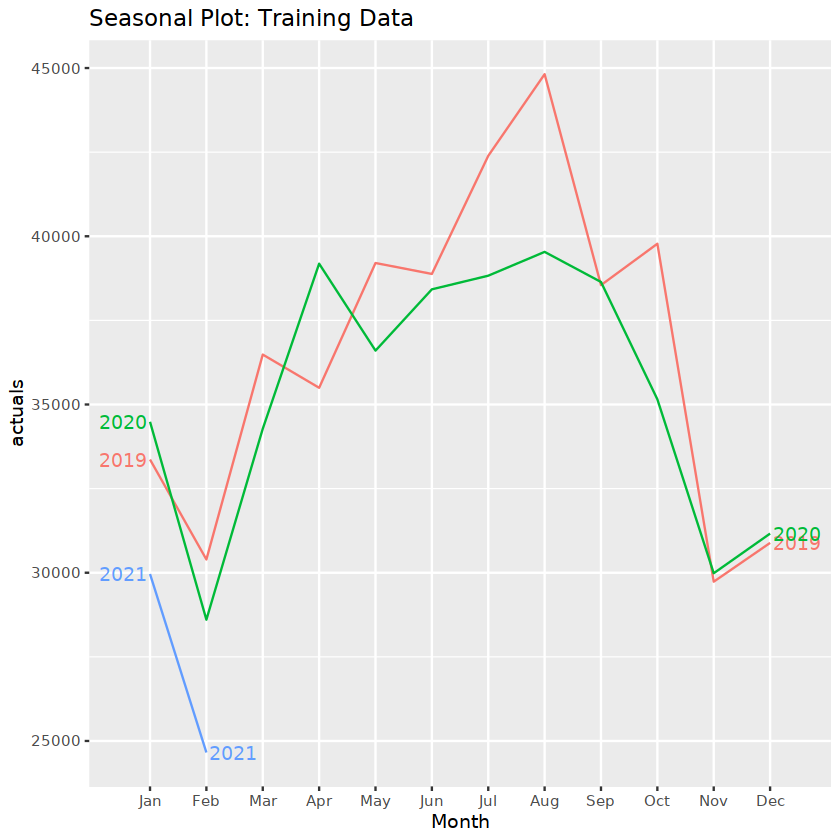

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”


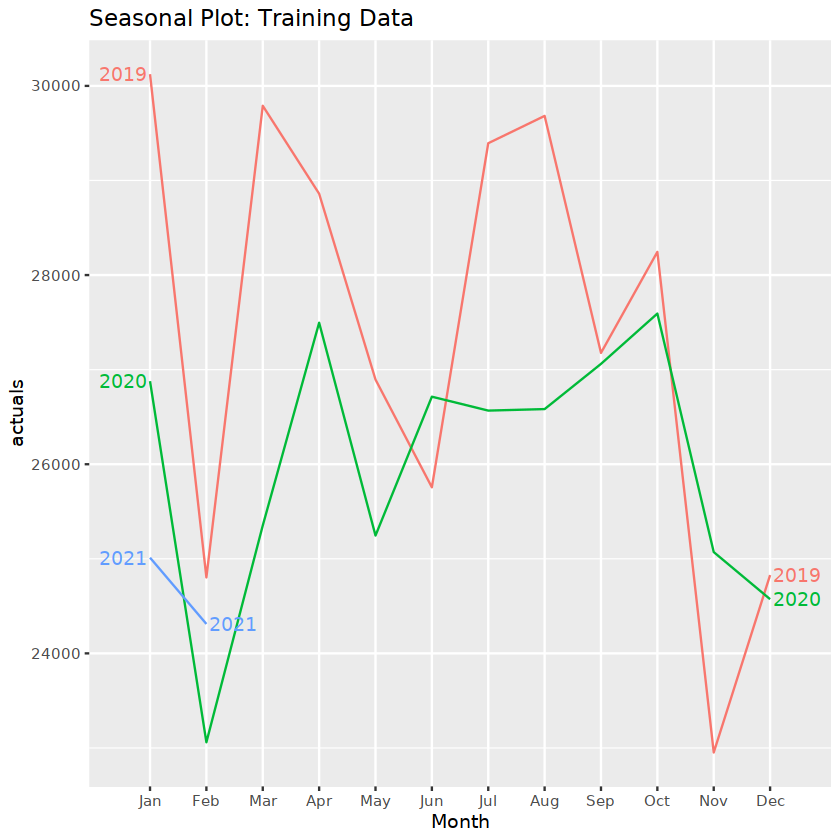

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”


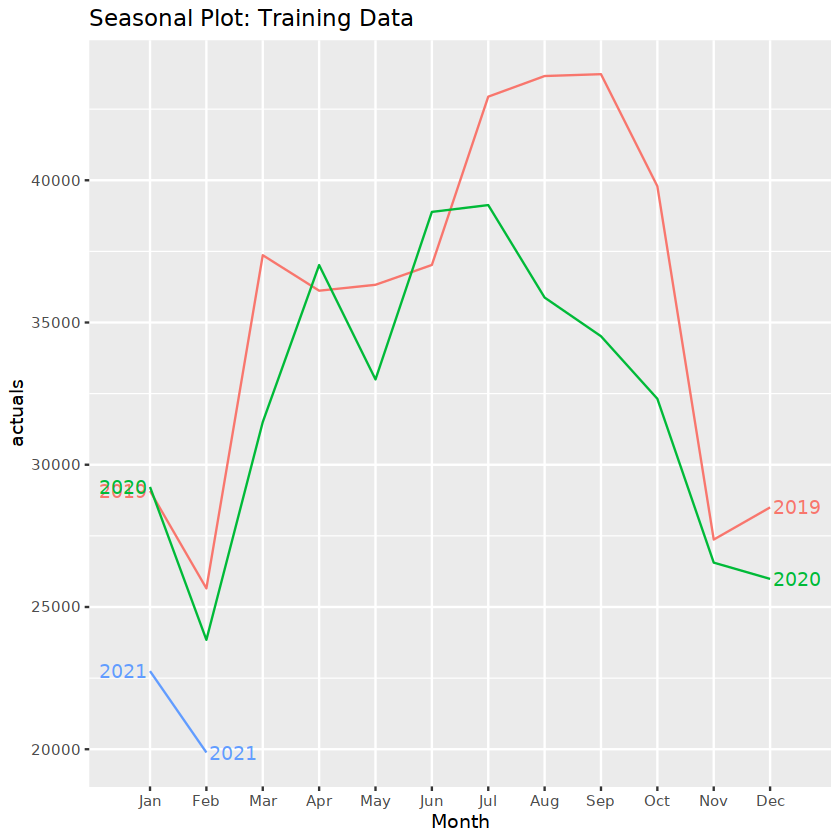

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”


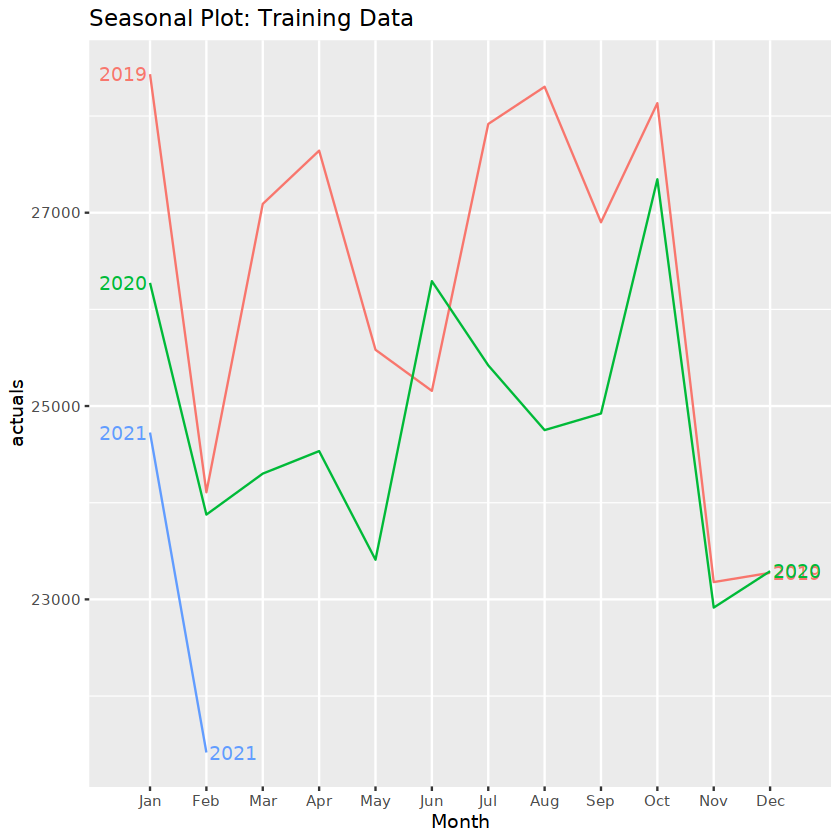

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”


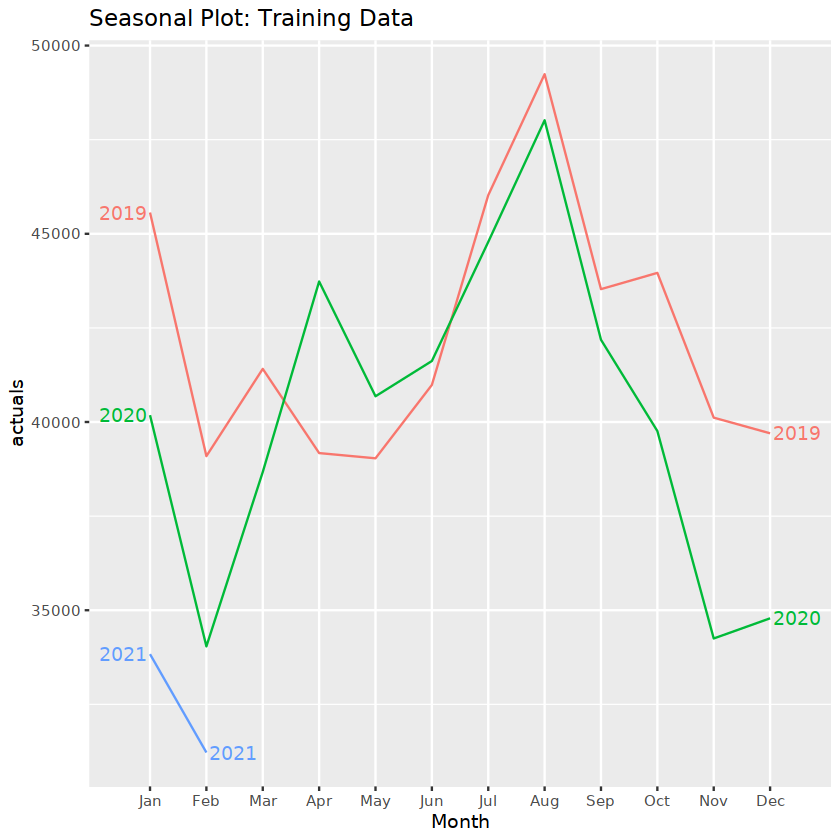

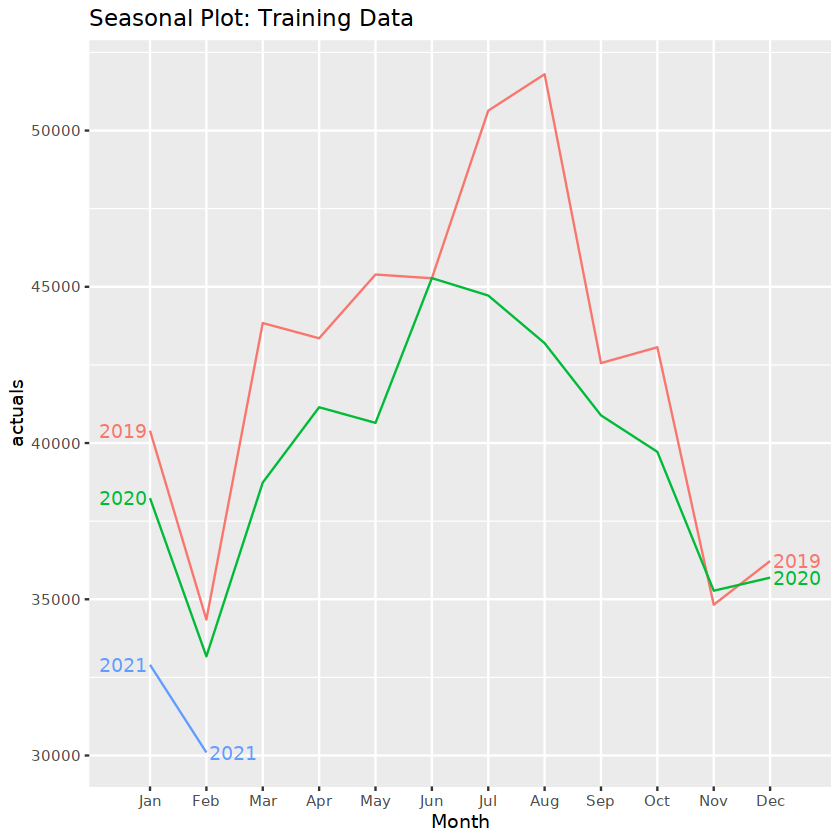

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?



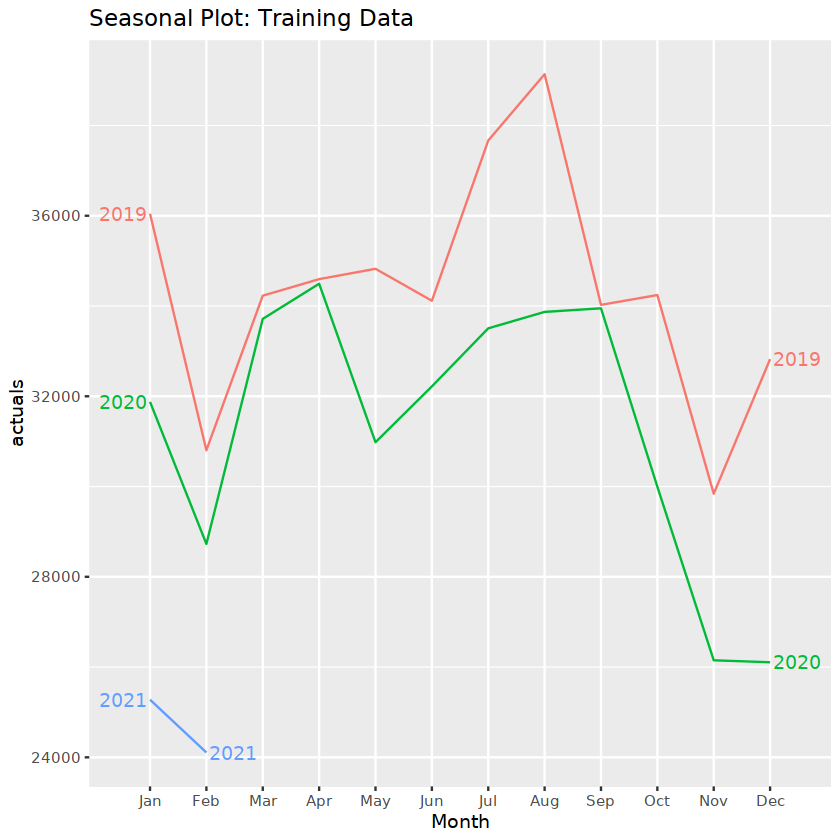

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?



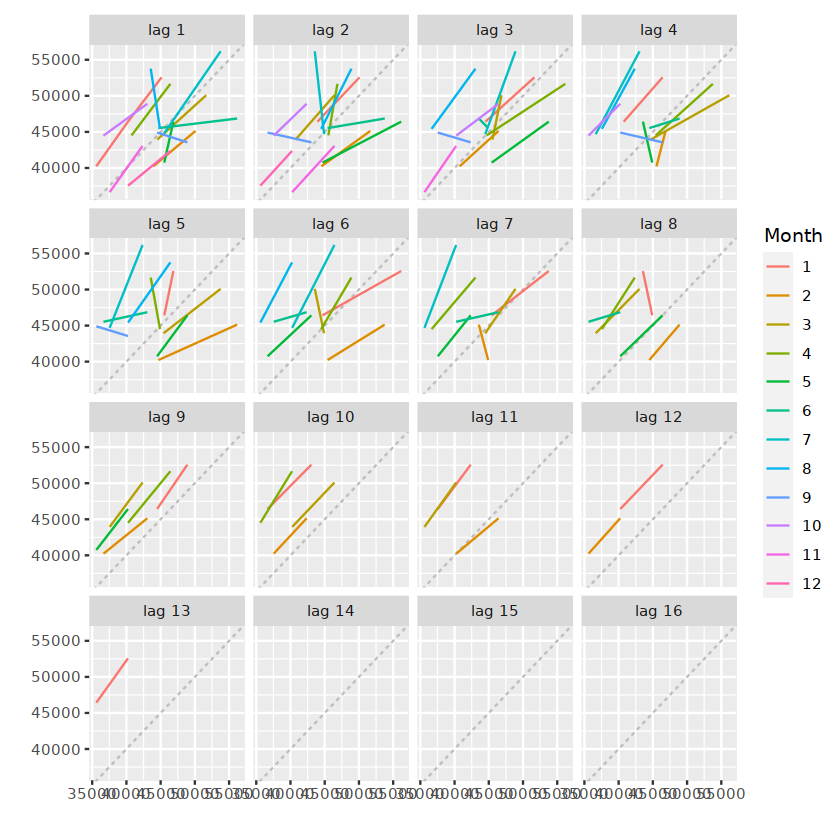

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?



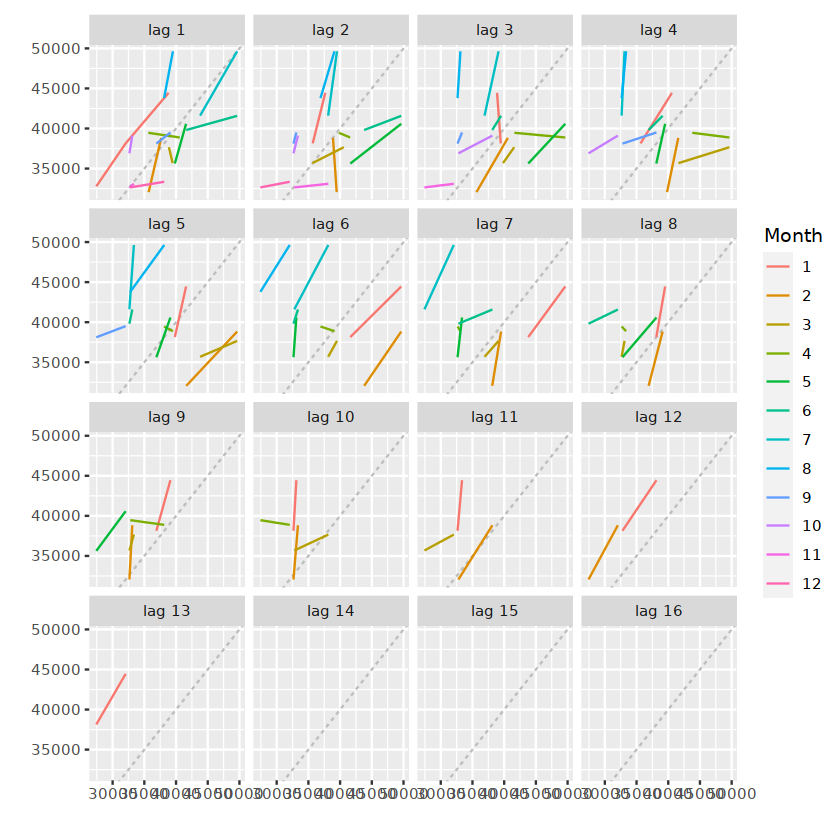

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?



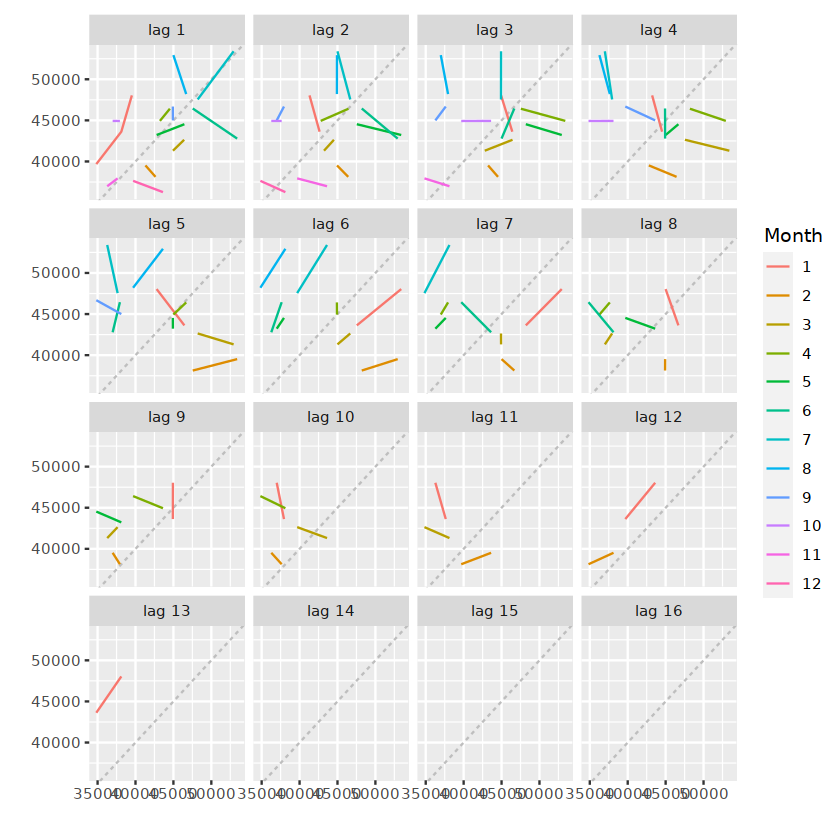

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?



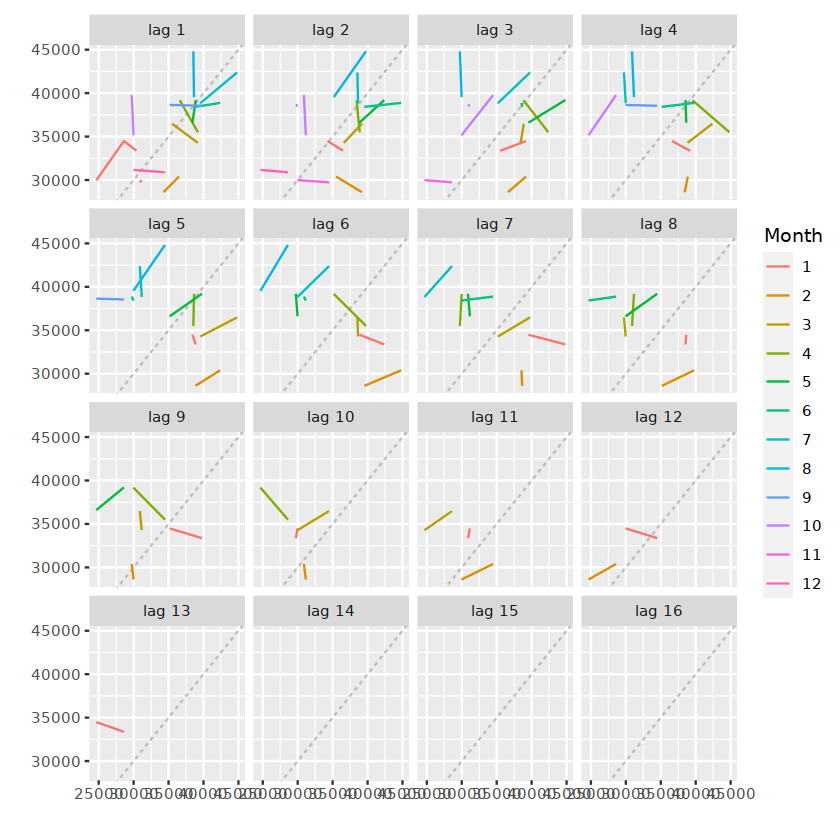

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?



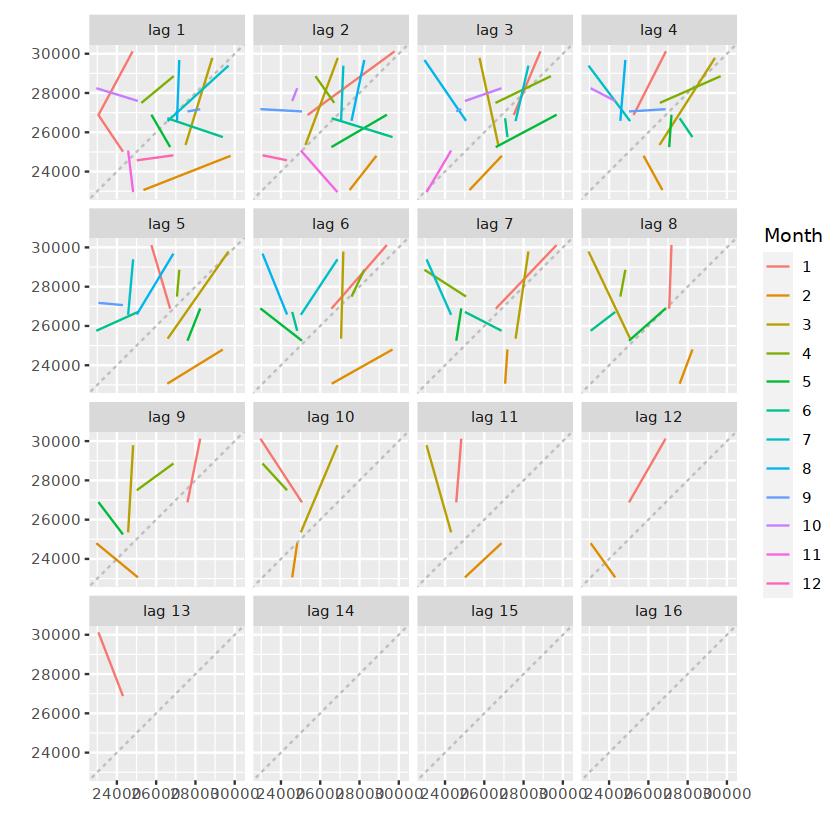

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?



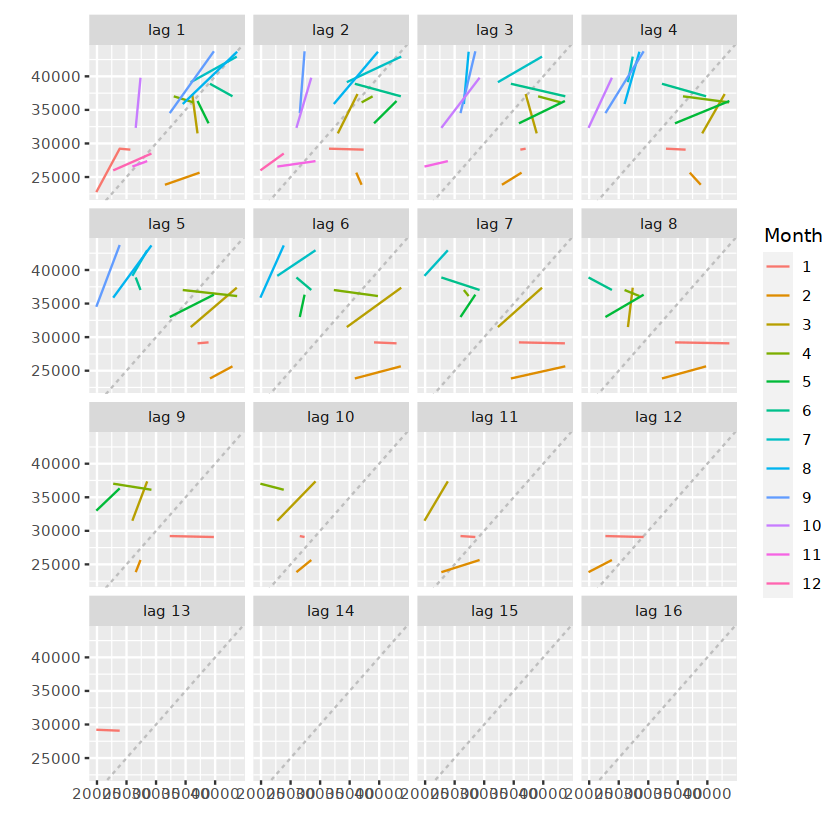

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?



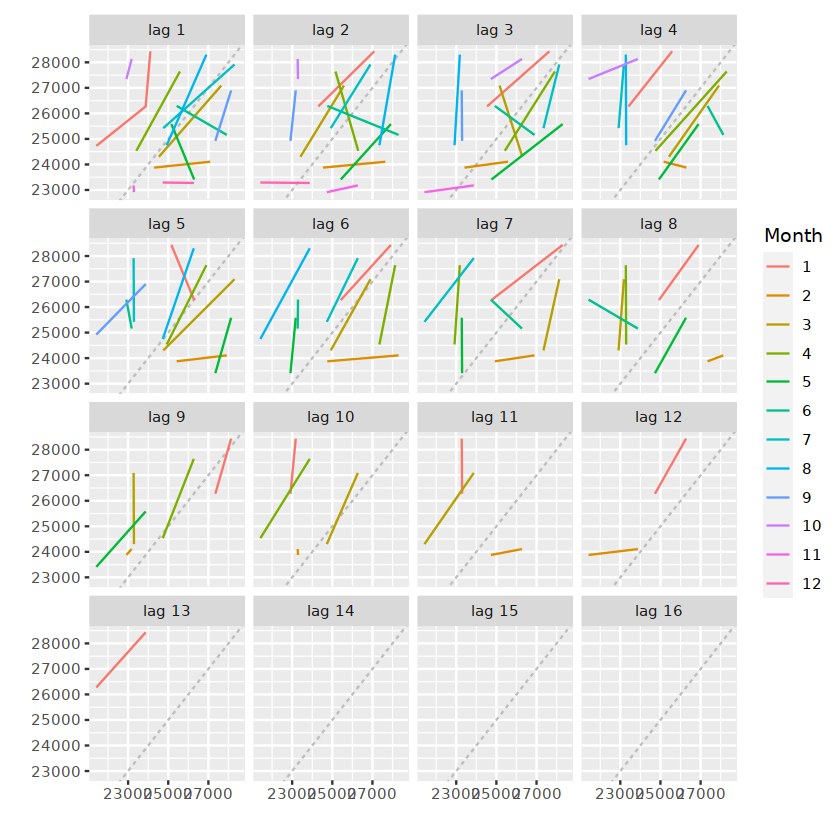

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?



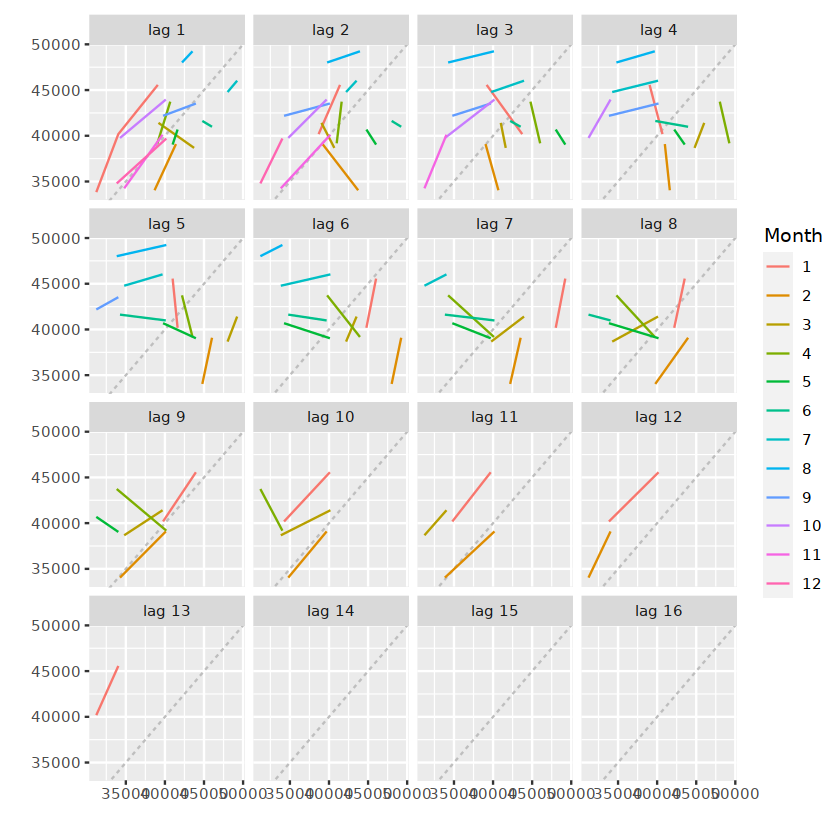

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?



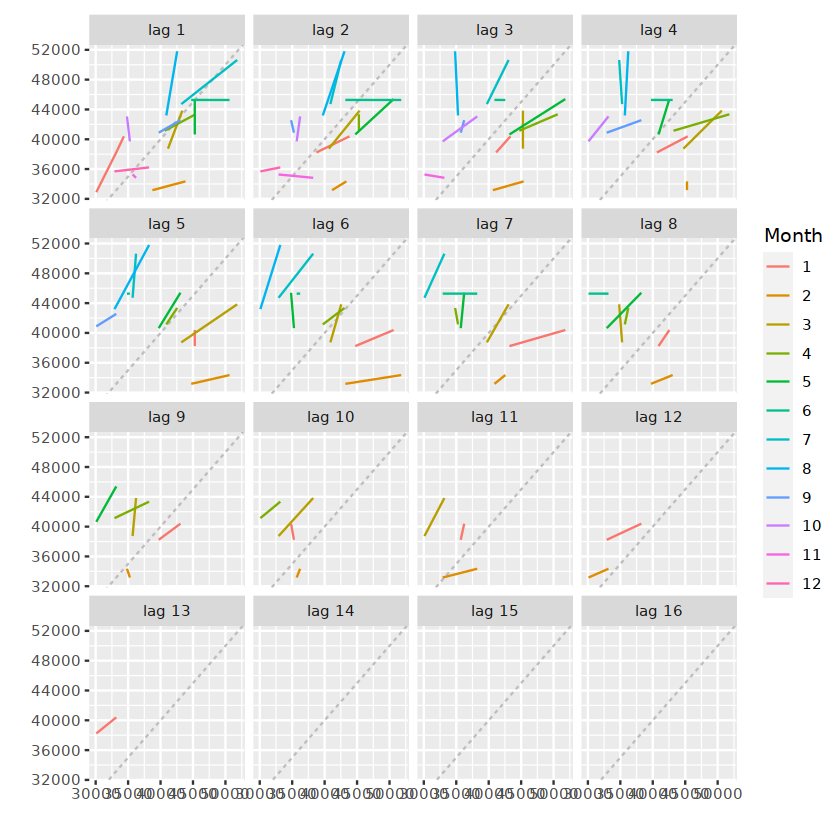

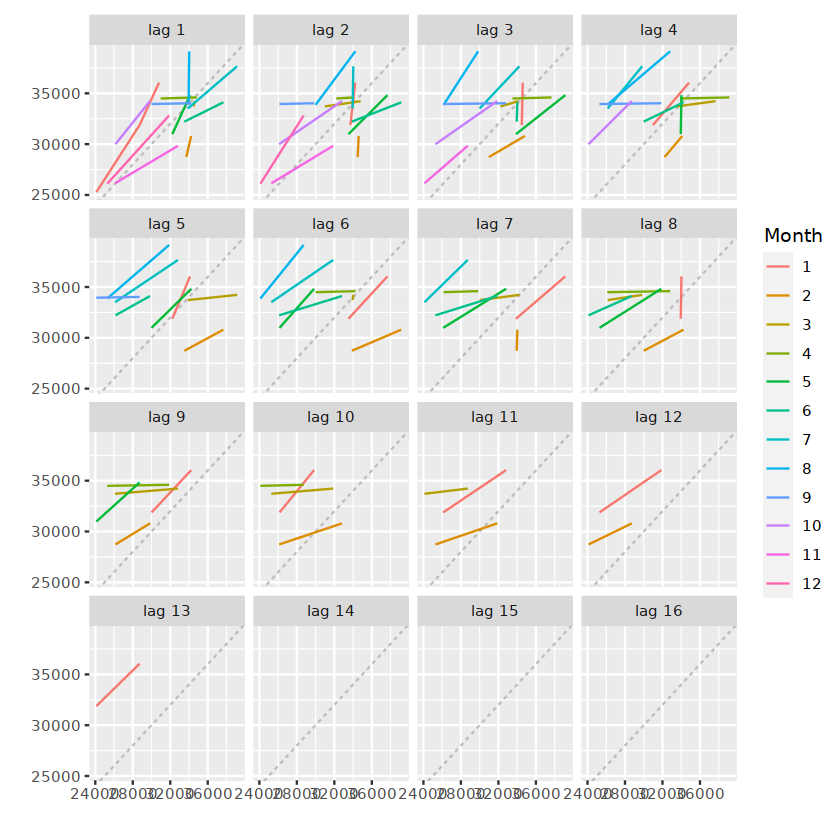

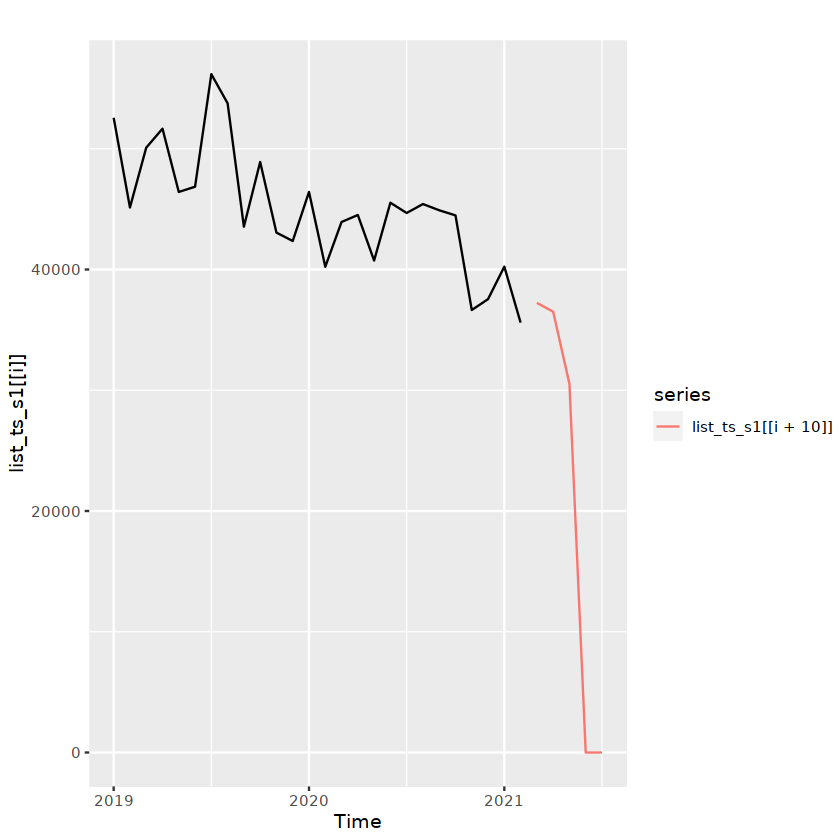

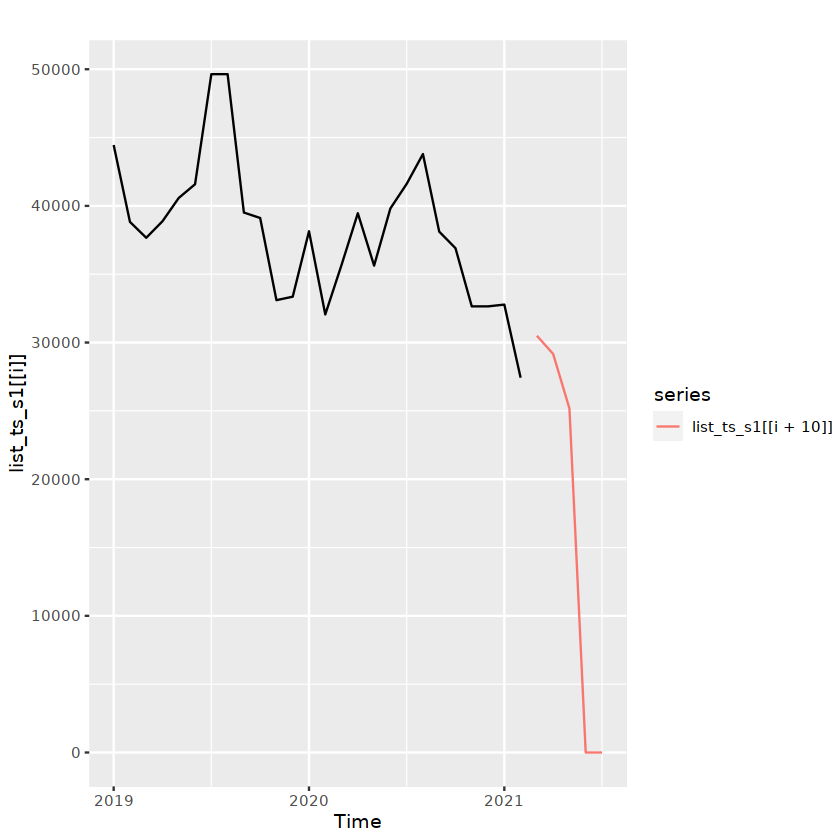

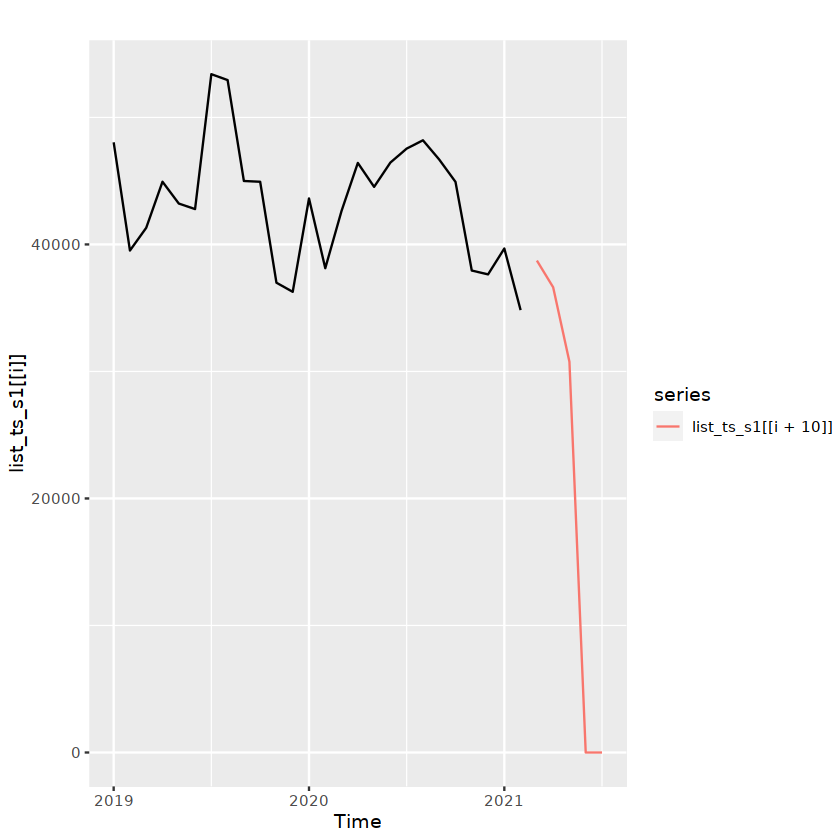

...

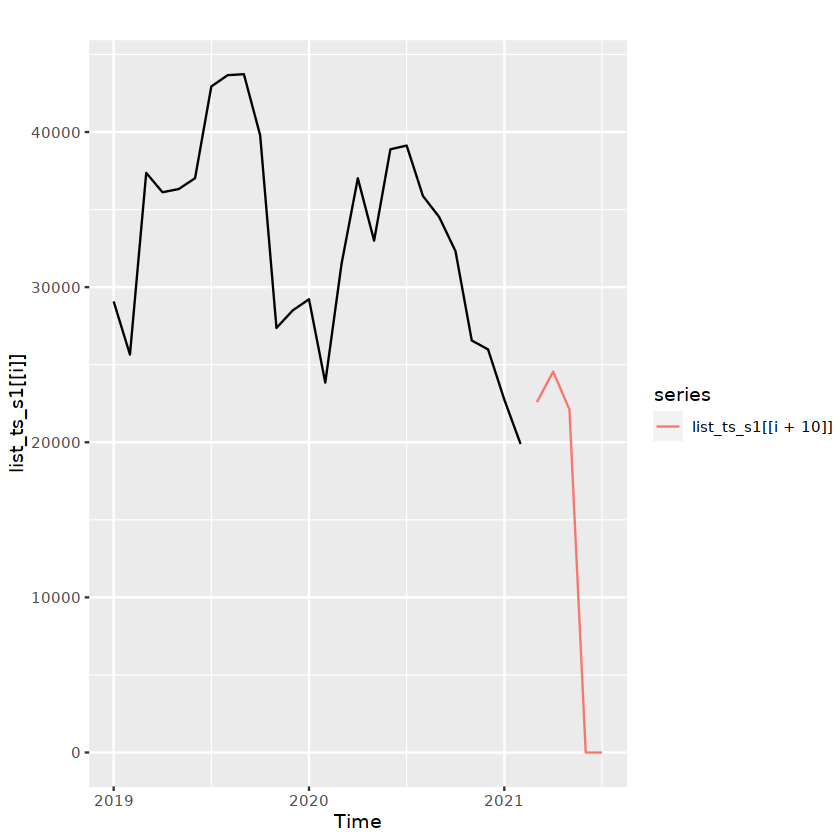

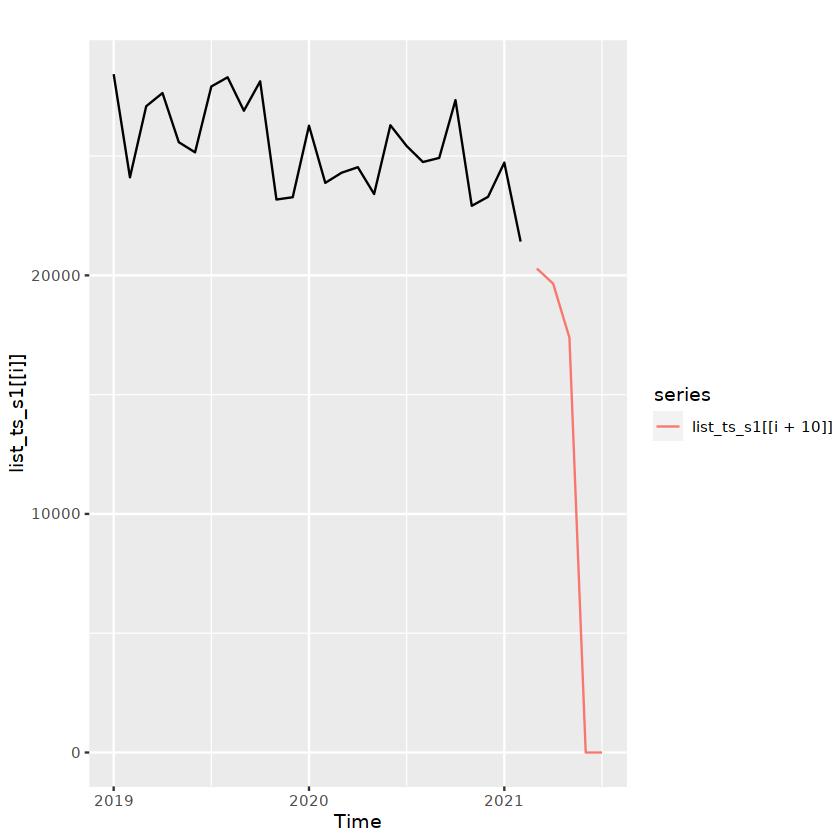

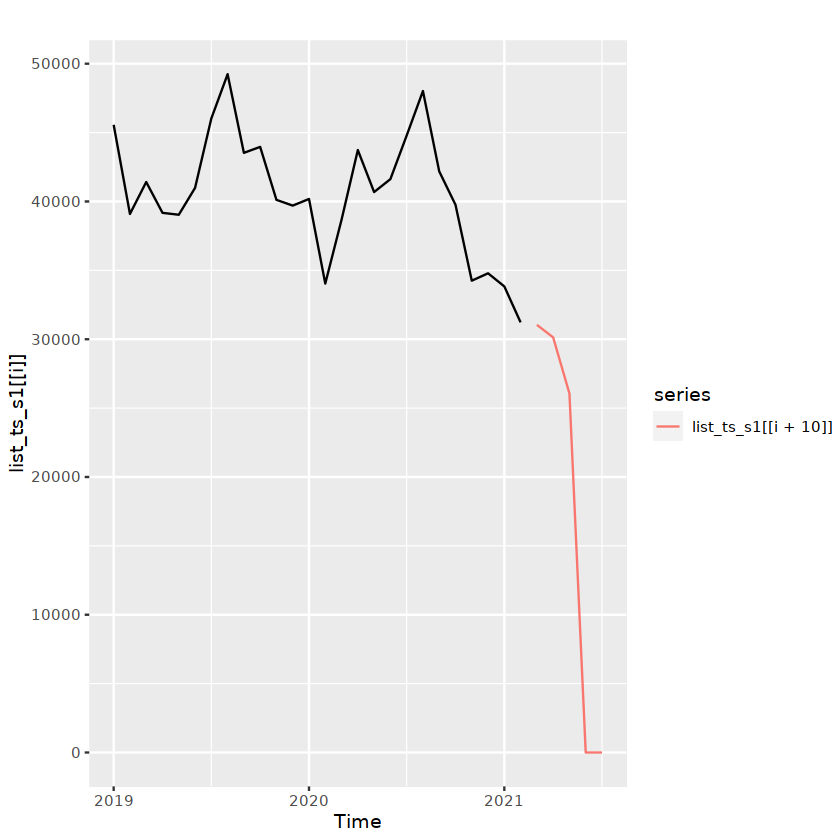

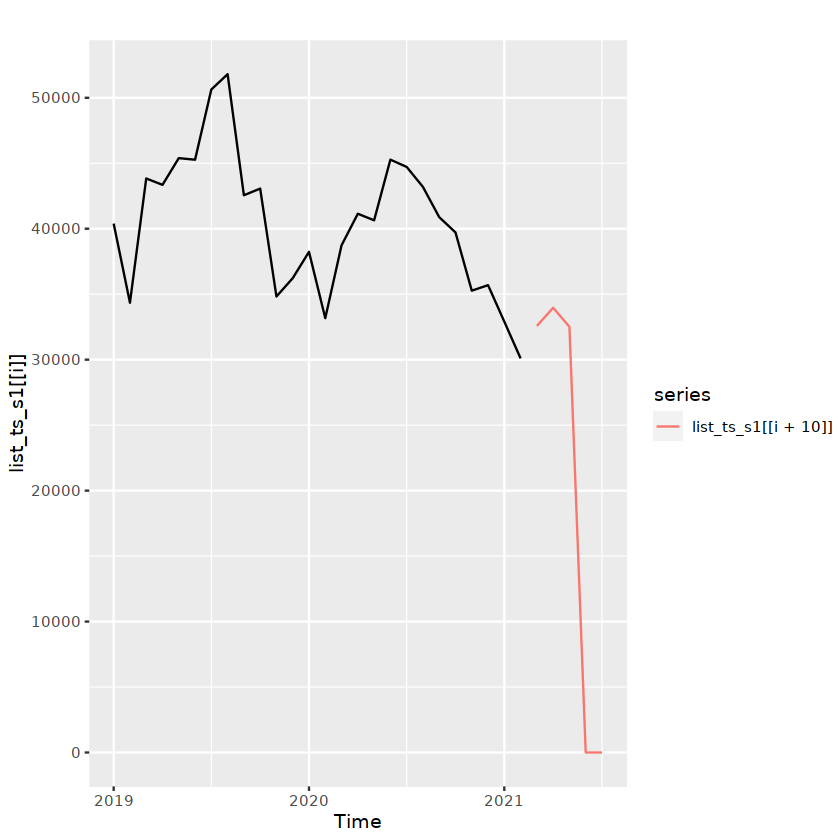

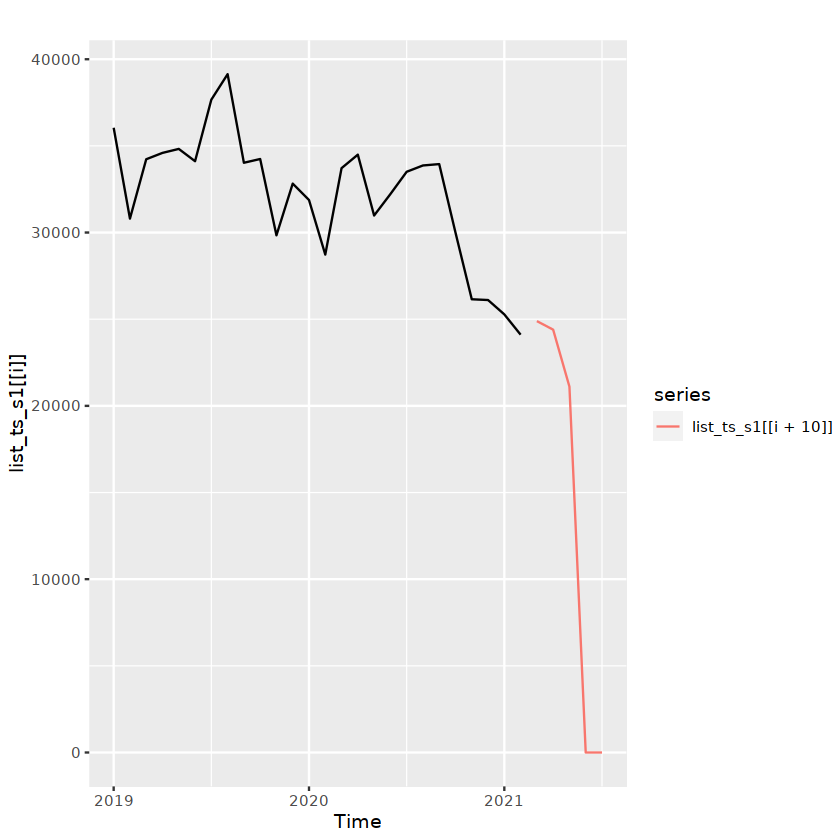

In [8]:
# EDA for scenario1, you dont need to run this
# This may stop the entire file to run because of how many graphs are being outputted
# Just comment this out, or run the next blocks

list_long_ts_s1 <- lapply(list_dfs_s1, function(t) ts(t,start=c(2019,1),end=c(2022,12), frequency = 12))
# interactive plots, you can click on the filters for Sub.Products
ggplotly(ggplot(scenario1,aes(x=Date,y=Volumes,color=product_subproduct))+geom_point())

ggplotly(ggplot(scenario1,aes(x=Date,y=Volumes,color=product_subproduct)) +
  geom_line())


for (i in 1:(length(list_long_ts_s1))){
  print(ggseasonplot(list_long_ts_s1[[i]], year.labels=TRUE, year.labels.left=TRUE) +
  ylab("actuals") +
  ggtitle("Seasonal Plot: Training Data"))
}


# plot train only
for (i in 1:(length(list_ts_s1)/2)){
  print(autoplot(list_ts_s1[[i]]))
}

# use moving averages decompose TS -> seasonal, trend, random components
for (i in 1:(length(list_ts_s1)/2)){
  print(ts_decompose(list_ts_s1[[i]]))
}

# training seasonal plot
for (i in 1:(length(list_ts_s1)/2)){
  print(ggseasonplot(list_ts_s1[[i]], year.labels=TRUE, year.labels.left=TRUE) +
  ylab("actuals") +
  ggtitle("Seasonal Plot: Training Data"))
}

# training data lags
for (i in 1:(length(list_ts_s1)/2)){
  print(gglagplot(list_ts_s1[[i]]))
}
      
# Plot training and test together                          
for (i in 1:(length(list_ts_s1)/2)){
  print(autoplot(list_ts_s1[[i]]) +
  autolayer(list_ts_s1[[i+10]]))
}                          

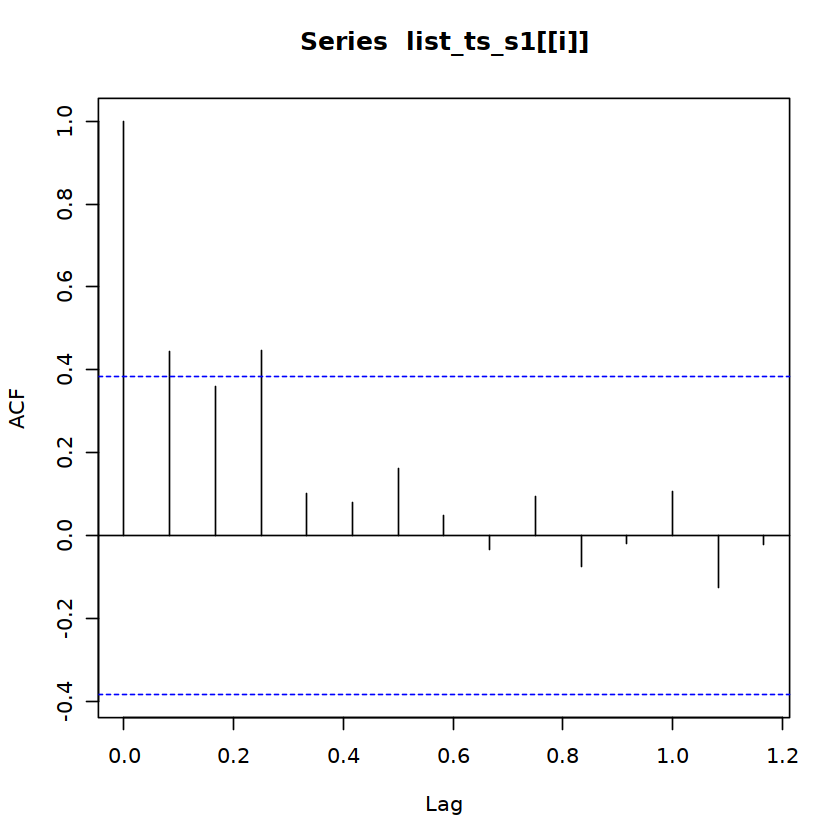

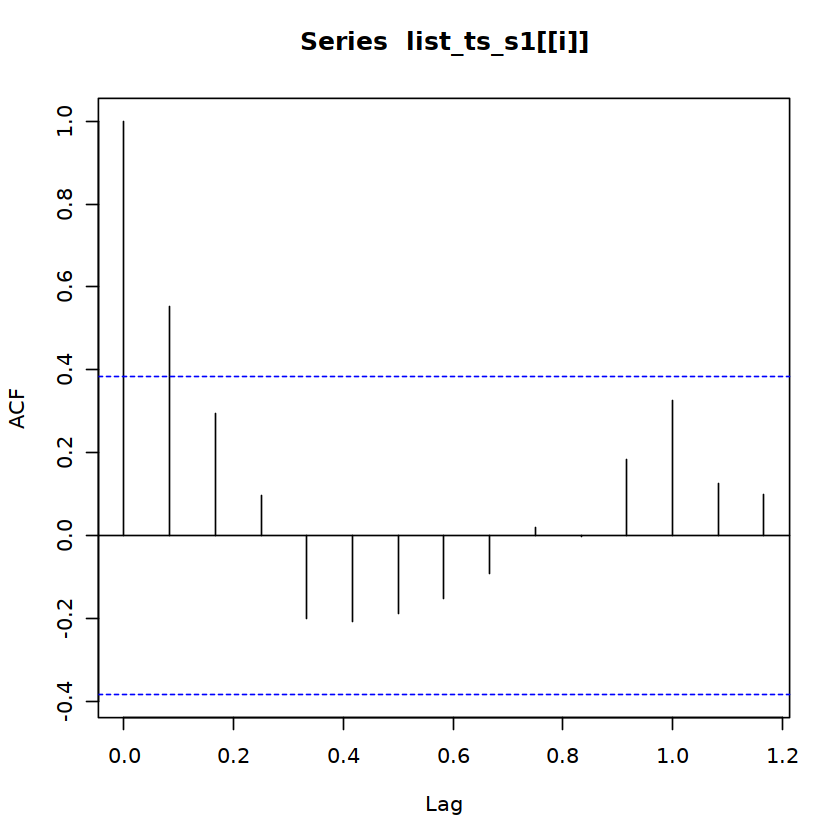

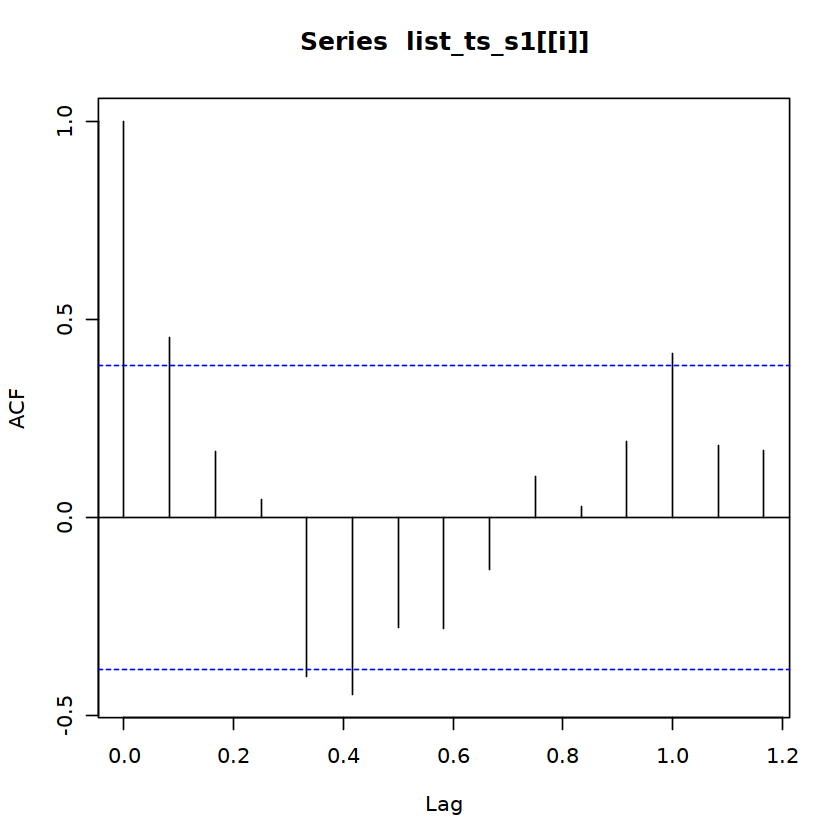

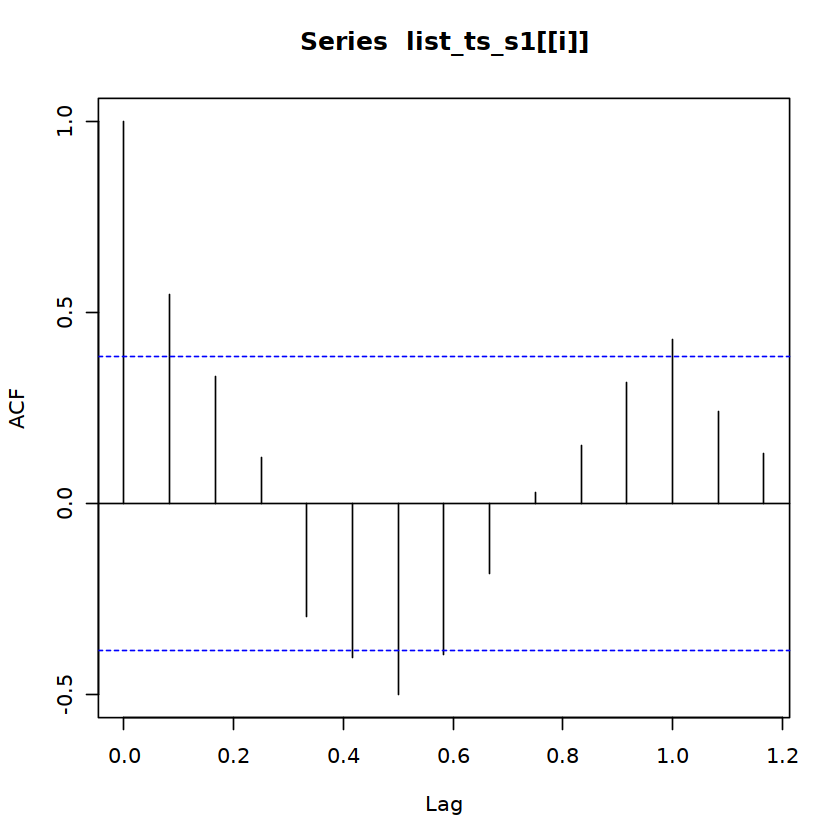

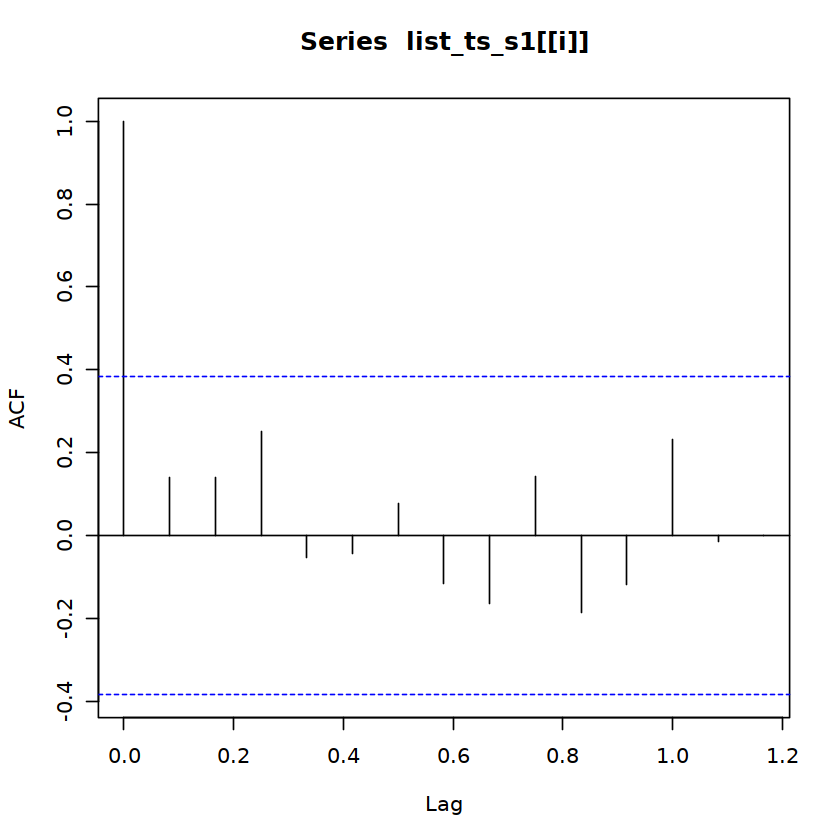

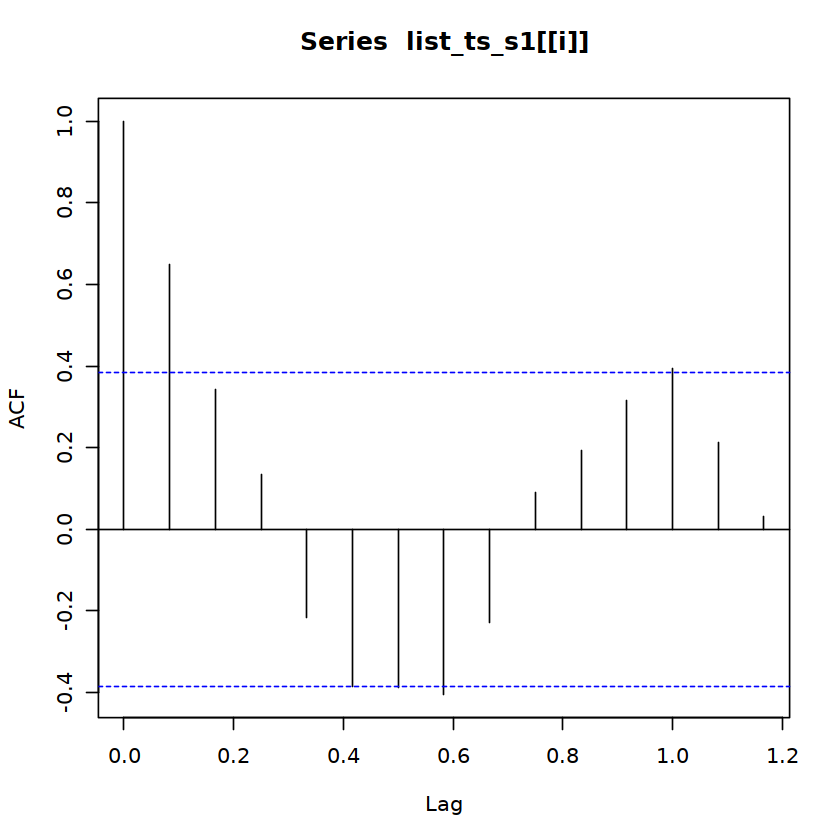

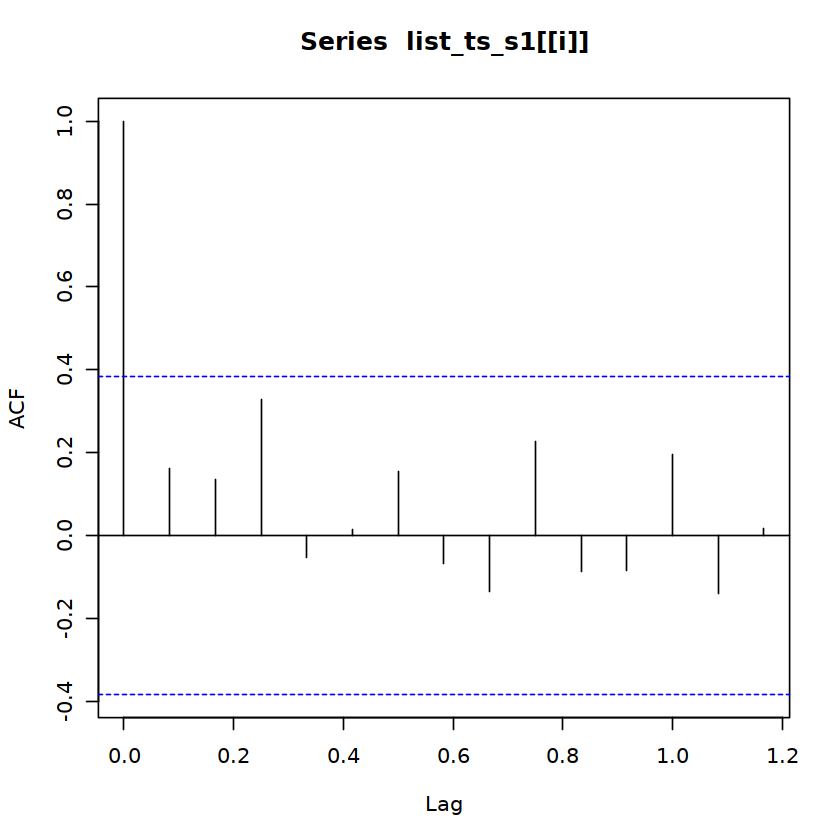

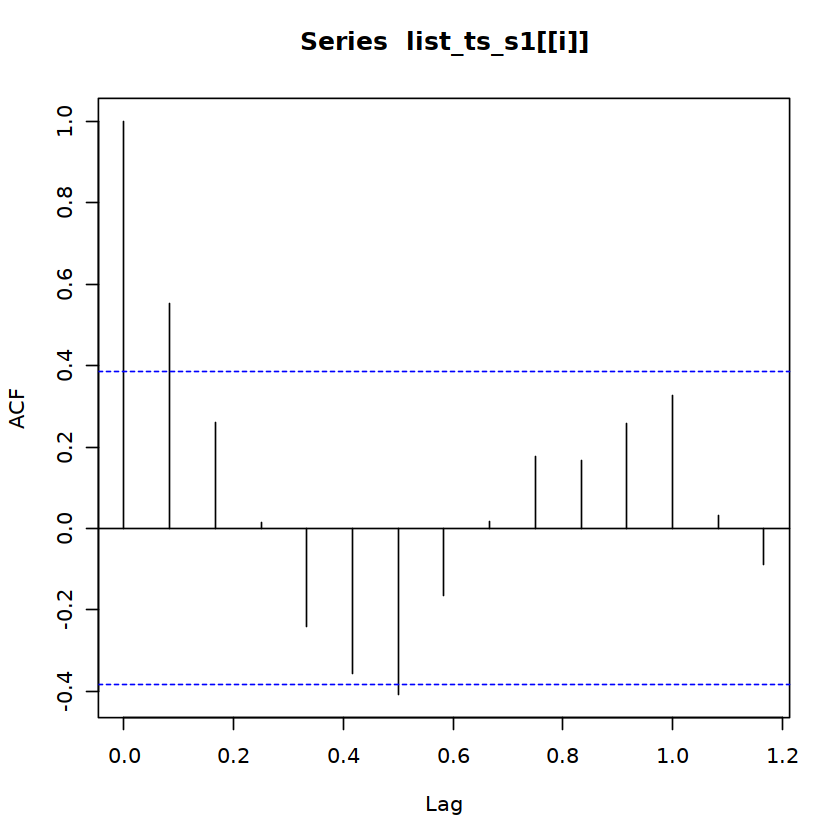

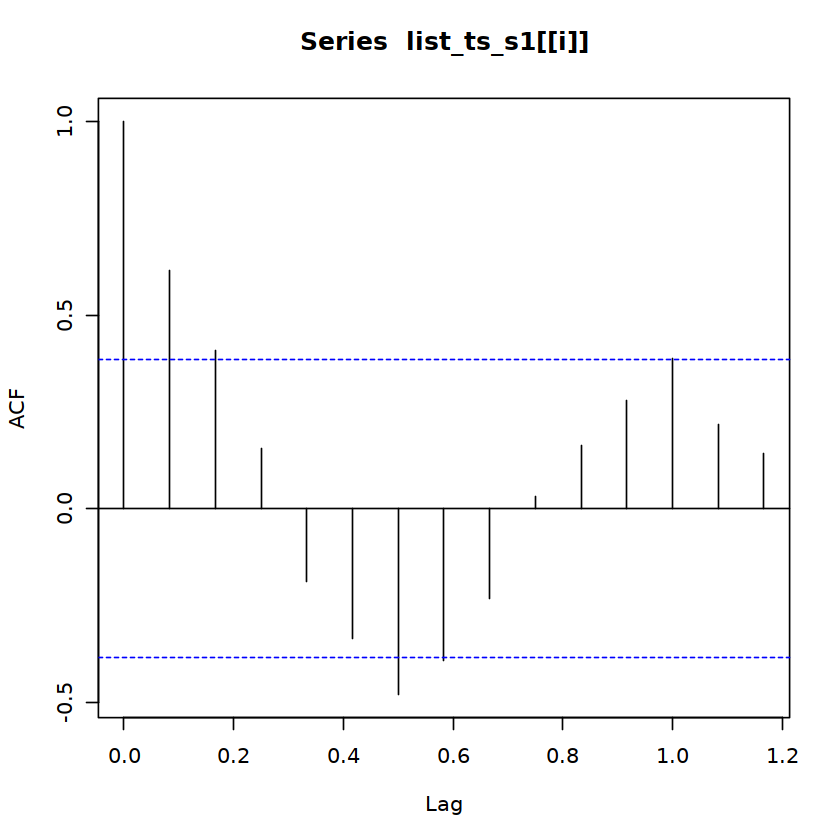


	Box-Ljung test

data:  list_ts_s1[[i]]
X-squared = 5.7722, df = 1, p-value = 0.01628


	Box-Ljung test

data:  list_ts_s1[[i]]
X-squared = 8.9159, df = 1, p-value = 0.002827


	Box-Ljung test

data:  list_ts_s1[[i]]
X-squared = 6.0126, df = 1, p-value = 0.0142


	Box-Ljung test

data:  list_ts_s1[[i]]
X-squared = 8.726, df = 1, p-value = 0.003137


	Box-Ljung test

data:  list_ts_s1[[i]]
X-squared = 0.57726, df = 1, p-value = 0.4474


	Box-Ljung test

data:  list_ts_s1[[i]]
X-squared = 12.29, df = 1, p-value = 0.0004554


	Box-Ljung test

data:  list_ts_s1[[i]]
X-squared = 0.75546, df = 1, p-value = 0.3848


	Box-Ljung test

data:  list_ts_s1[[i]]
X-squared = 8.8939, df = 1, p-value = 0.002861


	Box-Ljung test

data:  list_ts_s1[[i]]
X-squared = 11.012, df = 1, p-value = 0.0009053


	Box-Ljung test

data:  list_ts_s1[[i]]
X-squared = 10.768, df = 1, p-value = 0.001033



ERROR: Error in adf.test(list_ts_s1[[i]], alternative = "stationary"): could not find function "adf.test"


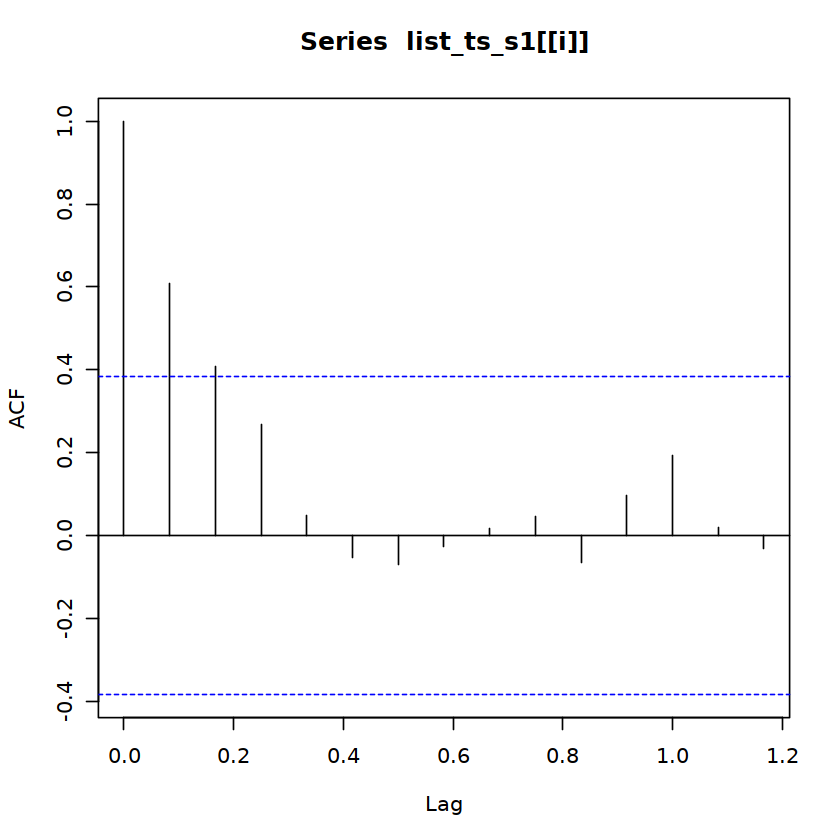

In [9]:
# Stationary Tests

# Checking to see if lags have correlation
for (i in 1:(length(list_ts_s1)/2)){
  acf(list_ts_s1[[i]])
}

# We want higher p-value
for (i in 1:(length(list_ts_s1)/2)){
   print( Box.test(list_ts_s1[[i]],type="Ljung-Box",fitdf = 0))
}

# we want low pvalue < 0.5
for (i in 1:(length(list_ts_s1)/2)){
   print(adf.test(list_ts_s1[[i]],alternative = "stationary"))
}

# We want low pvalue <0.5
for (i in 1:(length(list_ts_s1)/2)){
   print(kpss.test((list_ts_s1[[i]]),null="Trend"))
}

In [10]:
# Manual SES tuning
# Results of this aren't signficant

alpha <- seq(.01, .99, by = .01)
RMSE <- NA
#best <- vector('list', length(list_ts_s1)/2)


for(i in seq_along(alpha)) {
fit <- ses(list_ts_s1[[4]], alpha = alpha[i], h = 24)
RMSE[i] <- forecast::accuracy(fit,list_ts_s1[[14]])[2,2]}
  

print(RMSE %>% min())
(which.min(RMSE))

[1] 15912.38


[1] 99

In [11]:
# SES Forecast Results
# lapply to the entire list of time series from length (1 to length/2)
# Reason we use length/2 because there is training and test data in there, test is in the back half
# So we apply the SES function to each training data in list_ts_s1 and we can tune within the function
# The naming convention c1_ is the only thing that matters because i'm able to retrieve all of the models by using c1_
# if you want to rename c1_  it should be unique and no other object other than the models should have c1_ 

c1_simple_expo_smooth0 <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x) forecast::forecast(ses(x,h=24))) 
c1_simple_expo_smooth0 <- lapply(c1_simple_expo_smooth0, "[",  c("mean"))

# We can validate the forecasts with other criteria other than MAD (this is done in PowerBi)
# So the logic is if training data is element 1 of list_ts_s1, the respective test data is element 1 + (#uniquesubproducts)
# For field ops there are 10 prod+subproduct combos so 1 and 1+10
# The reason it's okay to have many models in the final output, is because we can basically filter it in PowerBi and...
# .... I have code to do the MAD selection within R, will be shown later
                                 
forecast::accuracy(forecast::forecast(ses(list_ts_s1[[1]],h=24)),list_ts_s1[[11]])                                 

,ME,RMSE,MAE,MPE,MAPE,MASE,ACF1,Theil's U
Training set,-1141.65,4009.976,3115.061,-3.251658,7.130436,0.5519244,-0.1025198,NA
Test set,-17529.16,24548.004,17529.162,-Inf,Inf,3.1058047,0.4341360,1.259758


In [12]:
# Holt Linear Trend 
# The same apply/forecast functions

c1_add_holtlineartrend <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x) forecast::forecast(holt(x,h=24,phi=0.9)))
c1_add_holtlineartrend <- lapply(c1_add_holtlineartrend, "[",  c("mean"))

c1_add_holtlineartrenddamp <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x) forecast::forecast(holt(x,h=24,damped=TRUE,phi=0.9)))
c1_add_holtlineartrenddamp <- lapply(c1_add_holtlineartrenddamp, "[",  c("mean"))

In [13]:
# ETS Space Models A= Additive, M= Multiplicative (ERROR,TREND,SEASONALITY)

c1_AAA_ets <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x) forecast::forecast(ets(x,model="AAA",opt.crit=c("mse"),ic=c("aicc")),h=24))
c1_AAA_ets <- lapply(c1_AAA_ets, "[",  c("mean"))

c1_MAA_ets <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x) forecast::forecast(ets(x,model="MAA",opt.crit=c("mse"),ic=c("aicc")),h=24))
c1_MAA_ets <- lapply(c1_MAA_ets, "[",  c("mean"))

c1_MAM_ets <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x) forecast::forecast(ets(x,model="MAM",opt.crit=c("mse"),ic=c("aicc")),h=24))
c1_MAM_ets <- lapply(c1_MAM_ets, "[",  c("mean"))

c1_MMM_ets <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x) forecast::forecast(ets(x,model="MMM",opt.crit=c("mse"),ic=c("aicc")),h=24))
c1_MMM_ets <- lapply(c1_MMM_ets, "[",  c("mean"))

c1_ANA_ets <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x) forecast::forecast(ets(x,model="ANA",opt.crit=c("mse"),ic=c("aicc")),h=24))
c1_ANA_ets <- lapply(c1_ANA_ets, "[",  c("mean"))

c1_MNA_ets <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x) forecast::forecast(ets(x,model="MNA",opt.crit=c("mse"),ic=c("aicc")),h=24))
c1_MNA_ets <- lapply(c1_MNA_ets, "[",  c("mean"))

c1_MNM_ets <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x) forecast::forecast(ets(x,model="MNM",opt.crit=c("mse"),ic=c("aicc")),h=24))
c1_MNM_ets <- lapply(c1_MNM_ets, "[",  c("mean"))

c1_AAN_ets <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x) forecast::forecast(ets(x,model="AAN",opt.crit=c("mse"),ic=c("aicc")),h=24))
c1_AAN_ets <- lapply(c1_AAN_ets, "[",  c("mean"))

c1_MAN_ets <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x) forecast::forecast(ets(x,model="MAN",opt.crit=c("mse"),ic=c("aicc")),h=24))
c1_MAN_ets <- lapply(c1_MAN_ets, "[",  c("mean"))

c1_MMN_ets <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x) forecast::forecast(ets(x,model="MMN",opt.crit=c("mse"),ic=c("aicc")),h=24))
c1_MMN_ets <- lapply(c1_MMN_ets, "[",  c("mean"))

In [14]:
# Grid search of HoltWinters... doesn't work in R version 3.6

# hwts <- ts(list_dfs[[3]],start=c(2019,1),end=c(2021,6),frequency=12)

# hw_grid <- ts_grid(hwts, 
#                    model = "HoltWinters",
#                    periods = 2,
#                    window_space = 1,
#                    window_test = 3,
#                    optim = c("RMSE"),
#                    parallel = TRUE,
#                    n.cores = 8,
#                    hyper_params = list(alpha = seq(0.01,1,0.1),
#                                        beta = seq(0.01,1,0.1),
#                                        gamma = seq(0.01,1,0.1)))
# # df1 a,b,g = .101, .001 .9001
# # df2 = .301 .701 0
# # df3 .101 .401 .9001
# # df4  .901 .201 .9001

                                       
# plot_grid(hw_grid, type = "3D")

In [15]:
# Double Exponential Smoothing HoltWinters

c1_double_holt_additive <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x)
  forecast::forecast( HoltWinters(x,gamma=FALSE,seasonal="additive"),h=24))

c1_double_holt_additive <- lapply(c1_double_holt_additive, "[",  c("mean"))

In [16]:
# Triple Exponenetial Smoothing Additive (Many Models, will take time)
# This just creates a combination of alpha,beta,gamma parameters and the code will generate that many models
# I limited the # of combinations because of computational time and SQL export limit
# This is my solution to not having a gridsearch option for HW, could be improved but works for now

n1 <- seq(0.1, 0.99, by = .2)
n2 <- seq(0.1, 0.99, by = .2)
n3 <- seq(0.1, 0.99, by = .29)

dat_n <- expand.grid(n1 = n1, n2= n2, n3 = n3) 
out<- lapply(seq_len(nrow(dat_n)), function(i) {
   c1_triple_holtwinters_additive <- lapply(list_ts_s1[1: 
(length(list_ts_s1)/2)], function(x) 
       forecast::forecast(HoltWinters(x,seasonal = "additive",alpha = 
dat_n$n1[i],beta=dat_n$n2[i],gamma=dat_n$n3[i])))
    c1_triple_holtwinters_additive <- 
 lapply(c1_triple_holtwinters_additive, "[", "mean")
  assign(paste0("c1_triple_holtwinters_additive", i), 
c1_triple_holtwinters_additive, envir = .GlobalEnv)
 c1_triple_holtwinters_additive})


    
# c1_triple_holtwinters_additive0 <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x)
#   forecast::forecast( HoltWinters(x,seasonal="additive"),h=24))

# c1_triple_holtwinters_additive0 <- lapply(c1_triple_holtwinters_additive0, "[",  c("mean"))


In [17]:
# Triple Exponential Smoothing Multiplicative (Many Models, will take time)

n1 <- seq(0.1, 0.99, by = .2)
n2 <- seq(0.1, 0.99, by = .2)
n3 <- seq(0.1, 0.99, by = .29)

dat_n <- expand.grid(n1 = n1, n2= n2, n3 = n3) 
out<- lapply(seq_len(nrow(dat_n)), function(i) {
   c1_triple_holtwinters_multiplicative <- lapply(list_ts_s1[1: 
(length(list_ts_s1)/2)], function(x) 
       forecast::forecast(HoltWinters(x,seasonal = "multiplicative",alpha = 
dat_n$n1[i],beta=dat_n$n2[i],gamma=dat_n$n3[i])))
    c1_triple_holtwinters_multiplicative <- 
 lapply(c1_triple_holtwinters_multiplicative, "[", "mean")
  assign(paste0("c1_triple_holtwinters_multiplicative", i), 
c1_triple_holtwinters_multiplicative, envir = .GlobalEnv)
 c1_triple_holtwinters_multiplicative})



#
c1_triple_holtwinters_multiplicative0 <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x)
  forecast::forecast( HoltWinters(x,seasonal="multiplicative"),h=24))

c1_triple_holtwinters_multiplicative0 <- lapply(c1_triple_holtwinters_multiplicative0, "[",  c("mean"))

In [18]:
# Semi-Manual Tuning of ARIMA
# Scroll down on the output for best model based off RMSE
# We used MAD, so we don't really need this

methods <- list(arima1 = list(method = "arima",
                              method_arg = list(order = c(0,0,0)),
                              notes = "ARIMA(0,0,0)"),
               arima2 = list(method = "arima",
                              method_arg = list(order = c(0,0,1)),
                              notes = "ARIMA(0,0,1)"),
                arima3 = list(method = "arima",
                              method_arg = list(order = c(0,1,1)),
                              notes = "ARIMA(0,1,1)"),
               arima4 = list(method = "arima",
                              method_arg = list(order = c(1,1,1)),
                              notes = "ARIMA(1,1,1)"),
                arima5 = list(method = "arima",
                              method_arg = list(order = c(1,1,0)),
                              notes = "ARIMA(1,1,0)"),
                arima6 = list(method = "arima",
                              method_arg = list(order = c(1,0,0)),
                              notes = "ARIMA(1,0,0)"),
                arima7 = list(method = "arima",
                              method_arg = list(order = c(2,1,0)),
                              notes = "ARIMA(2,1,0)"),
                arima8 = list(method = "arima",
                              method_arg = list(order = c(2,1,2)),
                              notes = "ARIMA(2,1,2)"),
                arima10 = list(method = "arima",
                              method_arg = list(order = c(1,1,3)),
                              notes = "ARIMA(1,1,3)"),
                arima11 = list(method = "arima",
                              method_arg = list(order = c(1,0,3)),
                              notes = "ARIMA(1,0,3)"),
                arima12 = list(method = "arima",
                              method_arg = list(order = c(2,0,3)),
                              notes = "ARIMA(2,0,3)"),
               arima13 = list(method = "arima",
                              method_arg = list(order = c(2,1,3)),
                              notes = "ARIMA(2,1,3)"),
                arima14 = list(method = "arima",
                              method_arg = list(order = c(2,1,1)),
                              notes = "ARIMA(2,1,1)"),
                arima15 = list(method = "arima",
                              method_arg = list(order = c(2,2,2)),
                              notes = "ARIMA(2,2,2)"),
                arima16 = list(method = "arima",
                              method_arg = list(order = c(0,1,2)),
                              notes = "ARIMA(0,1,2)"))
                
 methods

 md <- train_model(input = list_ts_s1[[1]],
                   methods = methods,
                   train_method = list(partitions = 1,
                                       sample.out = 5,
                                       space=1),
                   horizon = 24,
                   error = "RMSE")

 plot_error(md,error="RMSE")

$arima1
$arima1$method
[1] "arima"

$arima1$method_arg
$arima1$method_arg$order
[1] 0 0 0


$arima1$notes
[1] "ARIMA(0,0,0)"


$arima2
$arima2$method
[1] "arima"

$arima2$method_arg
$arima2$method_arg$order
[1] 0 0 1


$arima2$notes
[1] "ARIMA(0,0,1)"


$arima3
$arima3$method
[1] "arima"

$arima3$method_arg
$arima3$method_arg$order
[1] 0 1 1


$arima3$notes
[1] "ARIMA(0,1,1)"


$arima4
$arima4$method
[1] "arima"

$arima4$method_arg
$arima4$method_arg$order
[1] 1 1 1


$arima4$notes
[1] "ARIMA(1,1,1)"


$arima5
$arima5$method
[1] "arima"

$arima5$method_arg
$arima5$method_arg$order
[1] 1 1 0


$arima5$notes
[1] "ARIMA(1,1,0)"


$arima6
$arima6$method
[1] "arima"

$arima6$method_arg
$arima6$method_arg$order
[1] 1 0 0


$arima6$notes
[1] "ARIMA(1,0,0)"


$arima7
$arima7$method
[1] "arima"

$arima7$method_arg
$arima7$method_arg$order
[1] 2 1 0


$arima7$notes
[1] "ARIMA(2,1,0)"


$arima8
$arima8$method
[1] "arima"

$arima8$method_arg
$arima8$method_arg$order
[1] 2 1 2


$arima8$notes
[1] "ARIMA(2,1,2)"


$arima10
$arima10$method
[1] "arima"

$arima10$method_arg
$arima10$method_arg$order
[1] 1 1 3


$arima10$notes
[1] "ARIMA(1,1,3)"


$arima11
$arima11$method
[1] "arima"

$arima11$method_arg
$arima11$method_arg$order
[1] 1 0 3


$arima11$notes
[1] "ARIMA(1,0,3)"


$arima12
$arima12$method
[1] "arima"

$arima12$method_arg
$arima12$method_arg$order
[1] 2 0 3


$arima12$notes
[1] "ARIMA(2,0,3)"


$arima13
$arima13$method
[1] "arima"

$arima13$method_arg
$arima13$method_arg$order
[1] 2 1 3


$arima13$notes
[1] "ARIMA(2,1,3)"


$arima14
$arima14$method
[1] "arima"

$arima14$method_arg
$arima14$method_arg$order
[1] 2 1 1


$arima14$notes
[1] "ARIMA(2,1,1)"


$arima15
$arima15$method
[1] "arima"

$arima15$method_arg
$arima15$method_arg$order
[1] 2 2 2


$arima15$notes
[1] "ARIMA(2,2,2)"


$arima16
$arima16$method
[1] "arima"

$arima16$method_arg
$arima16$method_arg$order
[1] 0 1 2


$arima16$notes
[1] "ARIMA(0,1,2)"

# A tibble: 15 x 7
   model_id model notes     avg_mape avg_rmse `avg_coverage_80… `avg_coverage_9…
   <chr>    <chr> <chr>        <dbl>    <dbl>             <dbl>            <dbl>
 1 arima15  arima ARIMA(2,…    0.136    5682.               0.8              1  
 2 arima3   arima ARIMA(0,…    0.155    6582.               0.4              1  
 3 arima4   arima ARIMA(1,…    0.156    6617.               0.4              1  
 4 arima14  arima ARIMA(2,…    0.160    6679.               0.4              0.8
 5 arima16  arima ARIMA(0,…    0.160    6734.               0.4              0.8
 6 arima8   arima ARIMA(2,…    0.164    6806.               0.4              0.6
 7 arima13  arima ARIMA(2,…    0.165    6834.               0.4              0.8
 8 arima10  arima ARIMA(1,…    0.165    6891.               0.4              0.8
 9 arima7   arima ARIMA(2,…    0.164    6921.               0.4              0.6
10 arima5   arima ARIMA(1,…    0.166    6930.               0.8              1  
11 arima1

HTML widgets cannot be represented in plain text (need html)

In [19]:
# ARIMA models
# Should work, but if it causes errors change Arima to arima, two different functions for arima
# auto.arima suggests the best arima model automatically

c1_autoregressive_integratedmovingaverage <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x)
  forecast::forecast( auto.arima(x,ic=c("aicc")),h=24))

c1_autoregressive_integratedmovingaverage <- lapply(c1_autoregressive_integratedmovingaverage, "[",  c("mean"))



# #2
c1_autoregressive_integratedmovingaverage_1 <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x)
  forecast::forecast( Arima(x,order=c(0,0,0)),ic=c("aicc"),h=24))

c1_autoregressive_integratedmovingaverage_1 <- lapply(c1_autoregressive_integratedmovingaverage_1, "[",  c("mean"))


#3
c1_autoregressive_integratedmovingaverage_2 <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x)
  forecast::forecast( Arima(x,order=c(0,0,1)),h=24))

c1_autoregressive_integratedmovingaverage_2 <- lapply(c1_autoregressive_integratedmovingaverage_2, "[",  c("mean"))

## 4

c1_autoregressive_integratedmovingaverage_3 <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x)
  forecast::forecast( Arima(x,order=c(0,1,1)),h=24))

c1_autoregressive_integratedmovingaverage_3 <- lapply(c1_autoregressive_integratedmovingaverage_3, "[",  c("mean"))

##5

c1_autoregressive_integratedmovingaverage_4 <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x)
  forecast::forecast( Arima(x,order=c(1,0,3)),h=24))

c1_autoregressive_integratedmovingaverage_4 <- lapply(c1_autoregressive_integratedmovingaverage_4, "[",  c("mean"))




## 19
c1_autoregressive_integratedmovingaverage_5 <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x)
  forecast::forecast( Arima(x,order=c(0,1,2)),h=24))

c1_autoregressive_integratedmovingaverage_5 <- lapply(c1_autoregressive_integratedmovingaverage_5, "[",  c("mean"))


Warning message in value[[3L]](cond):
“The chosen seasonal unit root test encountered an error when testing for the second difference. 1 seasonal differences will be used. Consider using a different unit root test.”
Warning message in value[[3L]](cond):
“The chosen seasonal unit root test encountered an error when testing for the second difference. 1 seasonal differences will be used. Consider using a different unit root test.”
Warning message in value[[3L]](cond):
“The chosen seasonal unit root test encountered an error when testing for the second difference. 1 seasonal differences will be used. Consider using a different unit root test.”
Warning message in value[[3L]](cond):
“The chosen seasonal unit root test encountered an error when testing for the second difference. 1 seasonal differences will be used. Consider using a different unit root test.”
Warning message in value[[3L]](cond):
“The chosen seasonal unit root test encountered an error when testing for the second difference. 1

In [20]:
# TSLM season+trend
c1_linearmodel_seasontrend <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x)
 forecast::forecast(tslm(x~season+trend),h=24))

c1_linearmodel_seasontrend <- lapply(c1_linearmodel_seasontrend, "[",  c("mean"))

# tslm trend
c1_linearmodel_trend <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x)
 forecast::forecast(tslm(x~trend),h=24))

c1_linearmodel_trend <- lapply(c1_linearmodel_trend, "[",  c("mean"))

In [21]:
# Cubic Spline
c1_cubicspline1 <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x) forecast::splinef(x,h=24,method=c("mle")))
c1_cubicspline1 <- lapply(c1_cubicspline1, "[",  c("mean"))

c1_cubicspline2 <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x) forecast::splinef(x,h=24,method=c("gcv")))
c1_cubicspline2 <- lapply(c1_cubicspline2, "[",  c("mean"))

In [22]:
# Dynamic Harmonic Regression
c1_dynamicharmonicregression <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x)
 forecast::forecast( auto.arima(x, xreg = fourier(x, K =3),seasonal=FALSE, lambda=NULL)
                     ,xreg=forecast::fourier(x, K=3, h=24)))

c1_dynamicharmonicregression <- lapply(c1_dynamicharmonicregression, "[",  c("mean"))

In [23]:
# TBATS
c1_boxcoxtransform_armaerrors_trend_seasonal <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x) forecast::forecast(tbats(x),h=24))
c1_boxcoxtransform_armaerrors_trend_seasonal <- lapply(c1_boxcoxtransform_armaerrors_trend_seasonal, "[",  c("mean"))

In [24]:
# Neural Networks don't work in R version 3.6

# c1_neuralnetwork1 <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x) forecast::forecast(nnetar(x,lambda="auto"),h=24))
# c1_neuralnetwork1 <- lapply(c1_neuralnetwork1, "[",  c("mean"))

# c1_neuralnetwork2 <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x) forecast::forecast(nnetar(x,lambda="auto",scale.inputs=TRUE),h=24))
# c1_neuralnetwork2 <- lapply(c1_neuralnetwork2, "[",  c("mean"))
# different package nnfor
# c1_neuralnetwork3 <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x) forecast::forecast(nnfor::mlp(x),h=24))
# c1_neuralnetwork3 <- lapply(c1_neuralnetwork3, "[",  c("mean"))
# 
# c1_neuralnetwork4 <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x) forecast::forecast(nnfor::mlp(x,hd=c(10,5)),h=24))
# c1_neuralnetwork4 <- lapply(c1_neuralnetwork4, "[",  c("mean"))
# 
# c1_neuralnetwork5 <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x) 
#   forecast::forecast(nnfor::mlp(x,hd=c(10,5),reps=5,comb="mean"),h=24))
# c1_neuralnetwork5 <- lapply(c1_neuralnetwork5, "[",  c("mean"))
# 
# c1_neuralnetwork6<- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x) 
#   forecast::forecast(nnfor::mlp(x,hd=c(10,5),reps=5,comb="mean",sel.lag=TRUE,
#                                 det.type="auto"),h=24))
# c1_neuralnetwork6 <- lapply(c1_neuralnetwork6, "[",  c("mean"))

In [25]:
#Manual tuning of SARIMA
# I ran it a few times and have a list of the best performing ones below
# Need to change list_ts_s1[[2]] to all of the training data elements
# Some SARIMA combinations throws an error, but it will run

d=1
D=1
s=4

for(p in 1:4)
  {for(q in 1:4)
    {for(P in 1:4)
      {for(Q in 1:4)
        {if(p+d+q+P+D+Q<=10)
        {model<-forecast::Arima(y=(list_ts_s1[[2]]),order=c(p-1,d,q-1),seasonal=list(order=c(P-1,D,Q-1),period=s))
        test<-Box.test(model$residuals,lag=log(length(model$residuals)))
        sse=sum(model$residuals^2)
        cat(p-1,d,q-1,P-1,D,Q-1, "AICC:",model$aicc,"SSE:",sse,'p-value:',test$p.value,'\n')
  
        }
      }
    }
  }
}

0 1 0 0 1 0 AICC: 435.83 SSE: 1141034237 p-value: 0.8087996 
0 1 0 0 1 1 AICC: 422.857 SSE: 386205140 p-value: 0.7741976 
0 1 0 0 1 2 AICC: 416.3405 SSE: 169645395 p-value: 0.6971079 
0 1 0 0 1 3 AICC: 416.4404 SSE: 115987445 p-value: 0.6763485 
0 1 0 1 1 0 AICC: 427.0926 SSE: 596377638 p-value: 0.6490187 
0 1 0 1 1 1 AICC: 419.4705 SSE: 233648169 p-value: 0.6432049 
0 1 0 1 1 2 AICC: 417.8242 SSE: 134550562 p-value: 0.6209359 
0 1 0 1 1 3 AICC: 422.2705 SSE: 158402882 p-value: 0.72586 
0 1 0 2 1 0 AICC: 407.3272 SSE: 108066435 p-value: 0.9893183 
0 1 0 2 1 1 AICC: 409.8533 SSE: 102699691 p-value: 0.836433 
0 1 0 2 1 2 AICC: 412.9306 SSE: 58222884 p-value: 0.8183964 
0 1 0 3 1 0 AICC: 409.8057 SSE: 102060555 p-value: 0.7951582 
0 1 0 3 1 1 AICC: 412.9447 SSE: 71478656 p-value: 0.6537378 
0 1 1 0 1 0 AICC: 438.0242 SSE: 1126109847 p-value: 0.9725165 
0 1 1 0 1 1 AICC: 425.4185 SSE: 382672348 p-value: 0.9370647 
0 1 1 0 1 2 AICC: 418.9574 SSE: 163797534 p-value: 0.9442856 
0 1 1 0 1 3 AI

In [26]:
# SARIMA models
# Exhaustive list of combinations, we need it because both scenarios should have the same models to join
n1 <- list(c(0,0,0),c(0,0,1),c(0,1,1),c(1,1,0),c(1,0,3),
            c(1,1,3), c(0,1,2),c(1,1,2),c(2,1,2),c(2,1,3),c(2,2,3))

#n1 <- list(c(0,0,1),c(1,1,1), c(0,1,2),c(1,1,3),c(2,1,1),c(2,1,2),c(1,1,2))
n2 <- list(c(0,1,0),c(1,0,0),c(1,1,0),c(1,1,1),c(0,0,1),c(0,1,1),c(1,0,1))
dat_n <- expand.grid(n1 = n1, n2 = n2)

#
out <- lapply(seq_len(nrow(dat_n)), function(i) {
      c1_sarima <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x)  {
         tryCatch({forecast::forecast(Arima(x, order = dat_n$n1[[i]],
           seasonal=list(order = dat_n$n2[[i]],
           period=2)),h=24)
           }, error = function(err) return(data.frame(mean = NA_real_))
           
           )})
      
     c1_sarima <- lapply(c1_sarima, "[", "mean")
     c1_sarima <- lapply(c1_sarima, function(x) if(all(is.na(x))) 0 else x)
   assign(paste0("c1_sarima", i), c1_sarima, envir = .GlobalEnv)})

In [27]:
# Turn all of our model outputs into an exportable format

lst1 <- do.call(Map, c(f = cbind, mget(ls(pattern = 'c1_'))))

# 
export_df1 <- Map(cbind, export_df_s1, lst1)

out <- Map(function(x, y) {x[colnames(y)] <- sapply(y,  function(u) c(rep(0, nrow(x) - length(u)), u)); x}, export_df1, lst1)

export_df1 <- bind_rows(out, .id = "Date")

date <- scenario1$Date

export_df1$Date <- date

export_df1 <- export_df1 %>% separate(product_subproduct, c("Product", "Sub.Product"), "_and_")

Warning message in data.frame(..., check.names = FALSE):
“row names were found from a short variable and have been discarded”
Warning message in data.frame(..., check.names = FALSE):
“row names were found from a short variable and have been discarded”
Warning message in data.frame(..., check.names = FALSE):
“row names were found from a short variable and have been discarded”
Warning message in data.frame(..., check.names = FALSE):
“row names were found from a short variable and have been discarded”
Warning message in data.frame(..., check.names = FALSE):
“row names were found from a short variable and have been discarded”
Warning message in data.frame(..., check.names = FALSE):
“row names were found from a short variable and have been discarded”
Warning message in data.frame(..., check.names = FALSE):
“row names were found from a short variable and have been discarded”
Warning message in data.frame(..., check.names = FALSE):
“row names were found from a short variable and have been dis

In [28]:
# Scenario1 csv
write.csv(export_df1,"scenario1_output.csv", row.names = FALSE)

In [ ]:
# In Forecast_Scenario2 ipynb file run the code for scenario2 csv output
# Will use a 3rd script to combine all the files together 
# Forecasting_CombineAllScenarios  is script name